<a href="https://colab.research.google.com/github/FullPowerMore02/data-mining/blob/main/eth_multivariable.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Data and Library Loading

In [1]:
!pip install tensorflow pandas numpy matplotlib shap yfinance scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 8.4 MB/s eta 0:00:00


In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
from tensorflow import keras
import matplotlib.pyplot as plt
%matplotlib inline
import os
import shap
import yfinance as yf
from sklearn.model_selection import TimeSeriesSplit
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from keras.layers import Bidirectional
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
import shap
tf.compat.v1.disable_v2_behavior()

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Instructions for updating:
non-resource variables are not supported in the long term


In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score

from itertools import cycle

# ! pip install plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns

In [4]:
df = pd.read_csv("data01.csv")
df

,date,eth-usd_Open,eth-usd_High,eth-usd_Low,eth-usd_Close,eth-usd_Adj Close,eth-usd_Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,...,^n225_Open,^n225_High,^n225_Low,^n225_Close,^n225_Adj Close,^n225_Volume,day_sentiment,day_n_views,day_n_shares,FEDFUNDS
0,2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,...,22989.439453,23382.150391,22522.830078,22868.710938,22868.710938,160400000.0,-0.216567,93713.0,933.0,1.16
1,2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.102967,346006.0,3920.0,1.16
2,2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
3,2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
4,2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,...,22607.560547,22607.919922,22380.990234,22380.990234,22380.990234,80700000.0,-0.572450,74503.0,1089.0,1.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,...,30713.789062,31081.480469,30687.330078,30991.689453,30991.689453,89100000.0,0.000000,18273.0,156.0,5.33
2180,2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,...,30713.789062,31081.480469,30687.330078,30991.689453,30991.689453,89100000.0,0.000000,30024.0,77.0,5.33
2181,2023-10-30,1795.589111,1829.249512,1779.364502,1810.088623,1810.088623,7.534051e+09,34531.742188,34843.933594,34110.972656,...,30663.480469,30762.500000,30538.289062,30696.960938,30696.960938,187000000.0,0.027508,85031.0,689.0,5.33
2182,2023-10-31,1810.131592,1819.972656,1784.567627,1816.458984,1816.458984,6.477923e+09,34500.078125,34719.253906,34083.308594,...,30694.960938,30973.660156,30552.650391,30858.849609,30858.849609,134300000.0,-0.018740,75492.0,312.0,5.33


In [5]:
import pandas as pd

# Assuming 'data01.csv' contains your data
df = pd.read_csv("data01.csv")

# Define a dictionary with the new column names
new_column_names = {
    'date': 'Date',
    'eth-usd_Open': 'Open',
    'eth-usd_High': 'High',
    'eth-usd_Low': 'Low',
    'eth-usd_Close': 'Close',
    'eth-usd_Adj Close': 'Adj Close',
    'eth-usd_Volume': 'Volume'
}
# Rename the columns using the dictionary
df.rename(columns=new_column_names, inplace=True)

# Set 'date' as the index
df.set_index('Date', inplace=True)

# Now, your DataFrame has the updated column names and 'date' as the index
df.head()



,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,^n225_Open,^n225_High,^n225_Low,^n225_Close,^n225_Adj Close,^n225_Volume,day_sentiment,day_n_views,day_n_shares,FEDFUNDS
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,22989.439453,23382.150391,22522.830078,22868.710938,22868.710938,160400000.0,-0.216567,93713.0,933.0,1.16
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.102967,346006.0,3920.0,1.16
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,22607.560547,22607.919922,22380.990234,22380.990234,22380.990234,80700000.0,-0.572450,74503.0,1089.0,1.16


In [6]:
#df1 = yf.download('^GSPC', start='2012-01-01', end='2022-12-31')
df1 = df
df1.head()

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,^n225_Open,^n225_High,^n225_Low,^n225_Close,^n225_Adj Close,^n225_Volume,day_sentiment,day_n_views,day_n_shares,FEDFUNDS
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,22989.439453,23382.150391,22522.830078,22868.710938,22868.710938,160400000.0,-0.216567,93713.0,933.0,1.16
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.102967,346006.0,3920.0,1.16
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,22607.560547,22607.919922,22380.990234,22380.990234,22380.990234,80700000.0,-0.572450,74503.0,1089.0,1.16


In [7]:
#This df1 has been made to visualise data together
#Making the percentage changes in each day
df1['Pct_change'] = df1['Close'].pct_change()
# data['Pct_change'] = np.log(1+data['Pct_change'])
df1['Pct_change'] = np.log1p(df1['Pct_change'])
# Choose the desired time periods for the moving averages
short_period = 12  # Short-term EMA period
long_period = 26  # Long-term EMA period
signal_period = 9  # Signal line EMA period

# Calculate the short-term EMA
df1['Short EMA'] = df1['Close'].ewm(span=short_period, adjust=False).mean()

# Calculate the long-term EMA
df1['Long EMA'] = df1['Close'].ewm(span=long_period, adjust=False).mean()

# Calculate the MACD line
df1['MACD'] = df1['Short EMA'] - df1['Long EMA']

# Calculate the signal line
df1['Signal Line'] = df1['MACD'].ewm(span=signal_period, adjust=False).mean()

# Calculate the MACD histogra
df1['MACD Histogram'] = df1['MACD'] - df1['Signal Line']
# Choose the desired time period for the moving average and standard deviation
window = 20  # Number of Trading days in a month
num_std = 2
# 2 standard deviations above and below the middle band provides
#a range that encompasses a large portion of typical price movements

# Calculate the logarithmic returns
df1['Log Returns'] = np.log(df1['Close'] / df1['Close'].shift(1))

# Calculate the volatility
df1['Volatility'] = df1['Log Returns'].rolling(window=20).std() * np.sqrt(252)

# Calculate the middle band (simple moving average)
df1['Middle Band'] = df1['Close'].rolling(window=window).mean()

# Calculate the standard deviation of the closing prices
df1['Std Dev'] = df1['Close'].rolling(window=window).std()

# Calculate the upper band and lower band
df1['Upper Band'] = df1['Middle Band'] + (num_std * df1['Std Dev'])
df1['Lower Band'] = df1['Middle Band'] - (num_std * df1['Std Dev'])

#Making Next day's close price column in each date.
df1['Next_day'] = df1['Close'].shift(-1)


# Display the updated DataFrame with the Bollinger Bands columns
df1 = df1.dropna()

In [8]:
#Making the percentage changes in each day
df['Pct_change'] = df['Close'].pct_change()
# data['Pct_change'] = np.log(1+data['Pct_change'])
df['Pct_change'] = np.log1p(df['Pct_change'])
# Choose the desired time periods for the moving averages
short_period = 12  # Short-term EMA period
long_period = 26  # Long-term EMA period
signal_period = 9  # Signal line EMA period

# Calculate the short-term EMA
df['Short EMA'] = df['Close'].ewm(span=short_period, adjust=False).mean()

# Calculate the long-term EMA
df['Long EMA'] = df['Close'].ewm(span=long_period, adjust=False).mean()

# Calculate the MACD line
df['MACD'] = df['Short EMA'] - df['Long EMA']

# Calculate the signal line
df['Signal Line'] = df['MACD'].ewm(span=signal_period, adjust=False).mean()

# Calculate the MACD histogram
df['MACD Histogram'] = df['MACD'] - df['Signal Line']
# Choose the desired time period for the moving average and standard deviation
window = 20  # Number of Trading days in a month
num_std = 2
# 2 standard deviations above and below the middle band provides
#a range that encompasses a large portion of typical price movements

# Calculate the logarithmic returns
df['Log Returns'] = np.log(df['Close'] / df['Close'].shift(1))

# Calculate the volatility
df['Volatility'] = df['Log Returns'].rolling(window=20).std() * np.sqrt(252)

# Calculate the middle band (simple moving average)
df['Middle Band'] = df['Close'].rolling(window=window).mean()

# Calculate the standard deviation of the closing prices
df['Std Dev'] = df['Close'].rolling(window=window).std()

# Calculate the upper band and lower band
df['Upper Band'] = df['Middle Band'] + (num_std * df['Std Dev'])
df['Lower Band'] = df['Middle Band'] - (num_std * df['Std Dev'])

#Making Next day's close price column in each date.
df['Next_day'] = df['Close'].shift(-1)

# Display the updated DataFrame with the Created features
df

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,299.252991
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,-1.725551,-0.345110,-1.380441,-0.069790,NaN,NaN,NaN,NaN,NaN,314.681000
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,-1.827089,-0.641506,-1.185583,0.050270,NaN,NaN,NaN,NaN,NaN,307.907990
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,-2.426118,-0.998428,-1.427690,-0.021758,NaN,NaN,NaN,NaN,NaN,316.716003
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,-2.165161,-1.231775,-0.933386,0.028204,NaN,NaN,NaN,NaN,NaN,337.631012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,34089.574219,...,45.485737,22.846100,22.639636,-0.001927,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,34538.480469,...,48.428640,27.962608,20.466032,0.010598,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623
2023-10-30,1795.589111,1829.249512,1779.364502,1810.088623,1810.088623,7.534051e+09,34531.742188,34843.933594,34110.972656,34502.363281,...,51.342534,32.638593,18.703940,0.008067,0.279047,1663.471027,108.299164,1880.069355,1446.872698,1816.458984


In [9]:
df.isnull().sum()

Open                  0
High                  0
Low                   0
Close                 0
Adj Close             0
Volume                0
btc-usd_Open          0
btc-usd_High          0
btc-usd_Low           0
btc-usd_Close         0
btc-usd_Adj Close     0
btc-usd_Volume        0
cl=f_Open             0
cl=f_High             0
cl=f_Low              0
cl=f_Close            0
cl=f_Adj Close        0
cl=f_Volume           0
^dji_Open             0
^dji_High             0
^dji_Low              0
^dji_Close            0
^dji_Adj Close        0
^dji_Volume           0
^gspc_Open            0
^gspc_High            0
^gspc_Low             0
^gspc_Close           0
^gspc_Adj Close       0
^gspc_Volume          0
^ixic_Open            0
^ixic_High            0
^ixic_Low             0
^ixic_Close           0
^ixic_Adj Close       0
^ixic_Volume          0
^n225_Open            0
^n225_High            0
^n225_Low             0
^n225_Close           0
^n225_Adj Close       0
^n225_Volume    

In [10]:
df = df.dropna()
df

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-29,473.281006,522.307007,425.071014,427.523010,427.523010,2.675940e+09,10077.400391,11517.400391,9601.030273,9888.610352,...,37.185784,28.226306,8.959477,-0.100880,0.846353,379.305402,63.888660,507.082721,251.528082,447.114014
2017-11-30,431.214996,465.497009,401.243011,447.114014,447.114014,1.903040e+09,9906.790039,10801.000000,9202.049805,10233.599609,...,36.310079,29.843061,6.467018,0.044806,0.791214,386.698453,62.681287,512.061027,261.335879,466.540009
2017-12-01,445.209015,472.609009,428.312012,466.540009,466.540009,1.247880e+09,10198.599609,11046.700195,9694.650391,10975.599609,...,36.759847,31.226418,5.533429,0.042530,0.787766,394.291403,62.696023,519.683448,268.899358,463.449005
2017-12-02,466.851013,476.239014,456.653015,463.449005,463.449005,9.436500e+08,10978.299805,11320.200195,10905.099609,11074.599609,...,36.446739,32.270482,4.176256,-0.006647,0.778998,402.068454,61.041859,524.152173,279.984735,465.852997
2017-12-03,463.704987,482.813995,451.851990,465.852997,465.852997,9.905570e+08,11082.700195,11858.700195,10862.000000,11323.200195,...,35.977849,33.011956,2.965894,0.005174,0.780244,409.525304,59.146294,527.817892,291.232715,470.204010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-27,1803.794922,1804.135864,1751.440063,1780.045288,1780.045288,7.493400e+09,34156.500000,34238.210938,33416.886719,33909.800781,...,42.995111,17.186191,25.808920,-0.013389,0.316190,1633.411798,94.617292,1822.646382,1444.177214,1776.618164
2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,34089.574219,...,45.485737,22.846100,22.639636,-0.001927,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,34538.480469,...,48.428640,27.962608,20.466032,0.010598,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623


In [11]:
df.isnull().sum()

Open                 0
High                 0
Low                  0
Close                0
Adj Close            0
Volume               0
btc-usd_Open         0
btc-usd_High         0
btc-usd_Low          0
btc-usd_Close        0
btc-usd_Adj Close    0
btc-usd_Volume       0
cl=f_Open            0
cl=f_High            0
cl=f_Low             0
cl=f_Close           0
cl=f_Adj Close       0
cl=f_Volume          0
^dji_Open            0
^dji_High            0
^dji_Low             0
^dji_Close           0
^dji_Adj Close       0
^dji_Volume          0
^gspc_Open           0
^gspc_High           0
^gspc_Low            0
^gspc_Close          0
^gspc_Adj Close      0
^gspc_Volume         0
^ixic_Open           0
^ixic_High           0
^ixic_Low            0
^ixic_Close          0
^ixic_Adj Close      0
^ixic_Volume         0
^n225_Open           0
^n225_High           0
^n225_Low            0
^n225_Close          0
^n225_Adj Close      0
^n225_Volume         0
day_sentiment        0
day_n_views

In [12]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'btc-usd_Open',
       'btc-usd_High', 'btc-usd_Low', 'btc-usd_Close', 'btc-usd_Adj Close',
       'btc-usd_Volume', 'cl=f_Open', 'cl=f_High', 'cl=f_Low', 'cl=f_Close',
       'cl=f_Adj Close', 'cl=f_Volume', '^dji_Open', '^dji_High', '^dji_Low',
       '^dji_Close', '^dji_Adj Close', '^dji_Volume', '^gspc_Open',
       '^gspc_High', '^gspc_Low', '^gspc_Close', '^gspc_Adj Close',
       '^gspc_Volume', '^ixic_Open', '^ixic_High', '^ixic_Low', '^ixic_Close',
       '^ixic_Adj Close', '^ixic_Volume', '^n225_Open', '^n225_High',
       '^n225_Low', '^n225_Close', '^n225_Adj Close', '^n225_Volume',
       'day_sentiment', 'day_n_views', 'day_n_shares', 'FEDFUNDS',
       'Pct_change', 'Short EMA', 'Long EMA', 'MACD', 'Signal Line',
       'MACD Histogram', 'Log Returns', 'Volatility', 'Middle Band', 'Std Dev',
       'Upper Band', 'Lower Band', 'Next_day'],
      dtype='object')

## 2.1 Checking the Correlation of each variables

<Axes: >

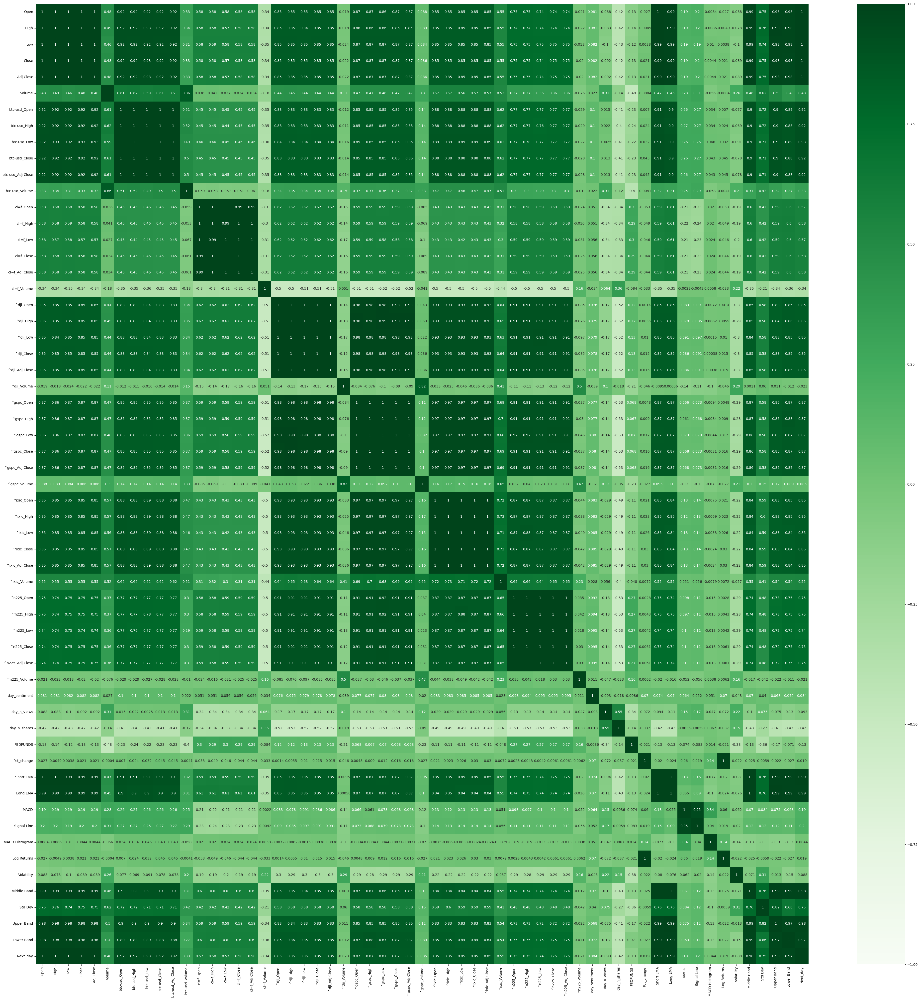

In [13]:
plt.rcParams["figure.figsize"] = (50,50)
sns.heatmap(df.corr(),
           annot = True, #Vaue on the heatmap
           cmap = 'Greens', #Colour
           vmin = -1, vmax=1 , #Boundary of Colour chart -1 ~ +1
          )

## 2.1 Checking the Correlation of each variables

In [14]:
df1.corr()

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Open,1.000000,0.999155,0.998196,0.997745,0.997745,0.477866,0.923531,0.920671,0.923458,0.919808,...,0.185387,0.199420,-0.008414,-0.026602,-0.087950,0.988681,0.753256,0.983585,0.978754,0.995823
High,0.999155,1.000000,0.997910,0.998834,0.998834,0.489843,0.924796,0.922981,0.925094,0.922256,...,0.190130,0.204511,-0.008595,-0.004931,-0.078043,0.988401,0.761907,0.984734,0.976593,0.996772
Low,0.998196,0.997910,1.000000,0.998847,0.998847,0.456610,0.921891,0.919512,0.924586,0.920347,...,0.186153,0.194369,0.010045,0.003804,-0.103506,0.986216,0.740622,0.979402,0.978601,0.996541
Close,0.997745,0.998834,0.998847,1.000000,1.000000,0.475208,0.924056,0.922544,0.926172,0.923475,...,0.190117,0.200360,0.004429,0.021341,-0.088696,0.986781,0.753366,0.981946,0.976542,0.997770
Adj Close,0.997745,0.998834,0.998847,1.000000,1.000000,0.475208,0.924056,0.922544,0.926172,0.923475,...,0.190117,0.200360,0.004429,0.021341,-0.088696,0.986781,0.753366,0.981946,0.976542,0.997770
Volume,0.477866,0.489843,0.456610,0.475208,0.475208,1.000000,0.610415,0.617650,0.592386,0.605266,...,0.277539,0.312245,-0.055717,-0.000399,0.255024,0.460601,0.619789,0.501502,0.398826,0.477135
btc-usd_Open,0.923531,0.924796,0.921891,0.924056,0.924056,0.610415,1.000000,0.999208,0.998598,0.998135,...,0.263468,0.268833,0.033936,0.006993,-0.077268,0.901894,0.717012,0.902055,0.886488,0.924613
btc-usd_High,0.920671,0.922981,0.919512,0.922544,0.922544,0.617650,0.999208,1.000000,0.998371,0.999160,...,0.265216,0.270698,0.033906,0.023741,-0.068646,0.899508,0.720904,0.900600,0.882912,0.923093
btc-usd_Low,0.923458,0.925094,0.924586,0.926172,0.926172,0.592386,0.998598,0.998371,1.000000,0.999002,...,0.262101,0.263505,0.046141,0.032448,-0.090981,0.901663,0.708431,0.900472,0.888046,0.926485
btc-usd_Close,0.919808,0.922256,0.920347,0.923475,0.923475,0.605266,0.998135,0.999160,0.999002,1.000000,...,0.263814,0.266474,0.042519,0.044524,-0.078435,0.898700,0.714722,0.898900,0.883296,0.923959


<Axes: xlabel='Date'>

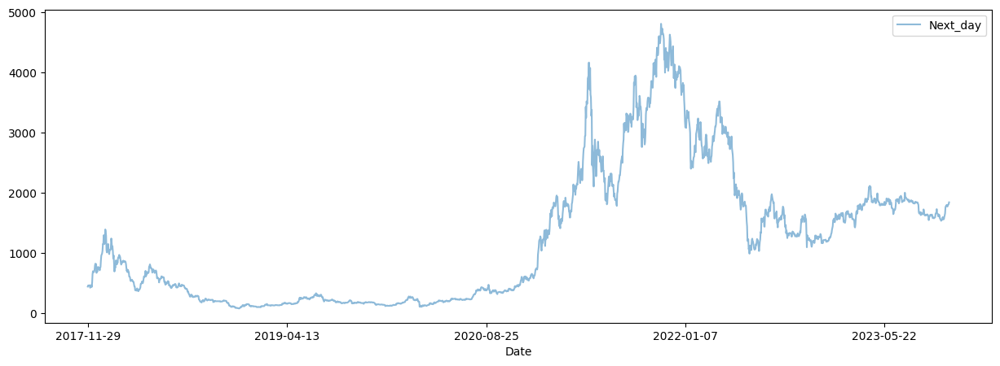

In [15]:
df[['Next_day']].plot(figsize = (15, 5), alpha = 0.5)

<Axes: xlabel='Date'>

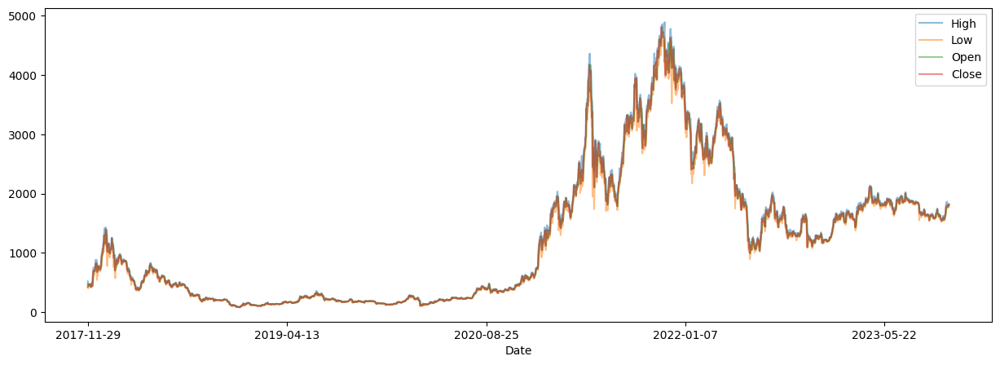

In [16]:
df[['High','Low','Open','Close']].plot(figsize = (15, 5), alpha = 0.5)

<Axes: xlabel='Date'>

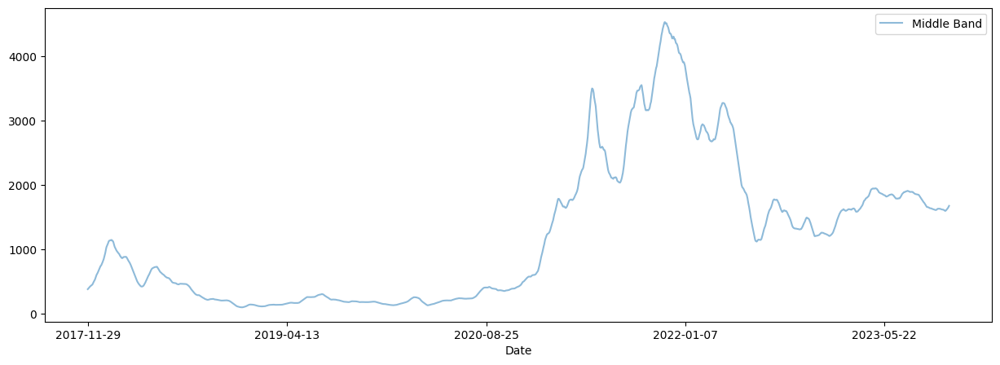

In [17]:
df[['Middle Band']].plot(figsize = (15, 5), alpha = 0.5)

Text(0.5, 1.0, 'Close Price trend with BollingerBand and the EMA')

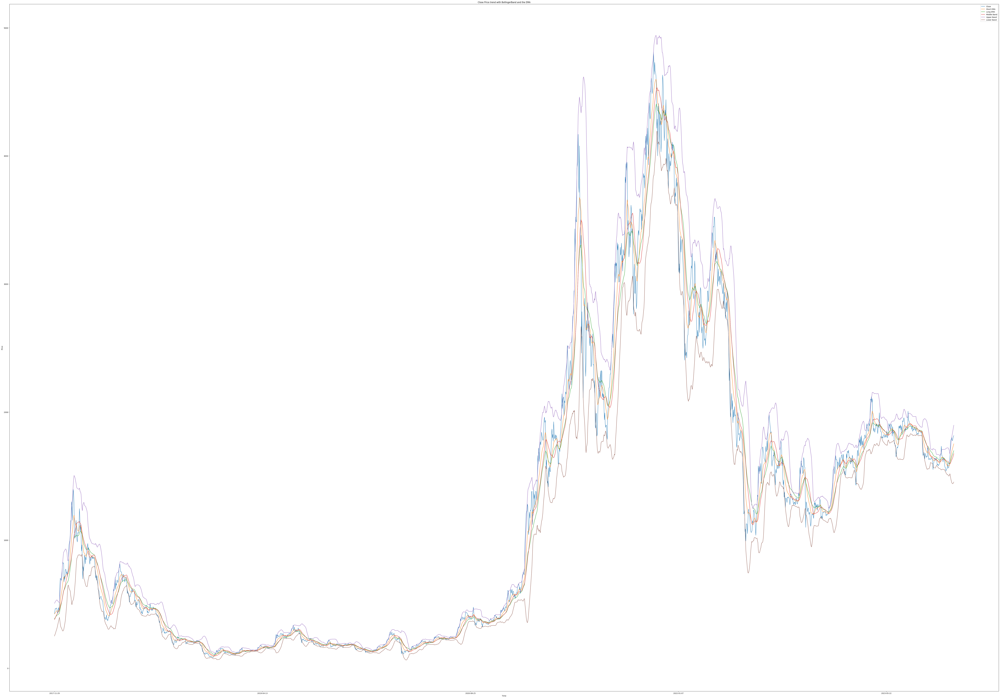

In [18]:
df[["Close","Short EMA", "Long EMA","Middle Band", 'Upper Band', 'Lower Band']].plot(figsize=(100,70))
plt.legend(loc="best")
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Close Price trend with BollingerBand and the EMA")

# 3. Data Scaling and Split to build LSTM
### Feature Engineering is done, Next_day column indicates the next day's close price of S&P 500, then this variable will be the target to predict.In next section, there will be an attempt to scale the original data and split this into test and train dataset for making LSTM model.

### Two methods.

### ==> Scale whole original dataset (df) and split into X and y and then split into test and train
### ==> Split and Scale X data only --> How does It work?


### 3.1 Data Dropping

In [19]:
df = df.drop(["Adj Close","Volume","Close",'Short EMA', 'Log Returns','Long EMA', 'MACD Histogram'],axis = 1)
df

,Open,High,Low,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,btc-usd_Adj Close,btc-usd_Volume,cl=f_Open,...,FEDFUNDS,Pct_change,MACD,Signal Line,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-29,473.281006,522.307007,425.071014,10077.400391,11517.400391,9601.030273,9888.610352,9888.610352,11568799744,57.730000,...,1.16,-0.100880,37.185784,28.226306,0.846353,379.305402,63.888660,507.082721,251.528082,447.114014
2017-11-30,431.214996,465.497009,401.243011,9906.790039,10801.000000,9202.049805,10233.599609,10233.599609,8310689792,57.410000,...,1.16,0.044806,36.310079,29.843061,0.791214,386.698453,62.681287,512.061027,261.335879,466.540009
2017-12-01,445.209015,472.609009,428.312012,10198.599609,11046.700195,9694.650391,10975.599609,10975.599609,6783119872,57.419998,...,1.30,0.042530,36.759847,31.226418,0.787766,394.291403,62.696023,519.683448,268.899358,463.449005
2017-12-02,466.851013,476.239014,456.653015,10978.299805,11320.200195,10905.099609,11074.599609,11074.599609,5138500096,57.419998,...,1.30,-0.006647,36.446739,32.270482,0.778998,402.068454,61.041859,524.152173,279.984735,465.852997
2017-12-03,463.704987,482.813995,451.851990,11082.700195,11858.700195,10862.000000,11323.200195,11323.200195,6608309760,57.419998,...,1.30,0.005174,35.977849,33.011956,0.780244,409.525304,59.146294,527.817892,291.232715,470.204010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-27,1803.794922,1804.135864,1751.440063,34156.500000,34238.210938,33416.886719,33909.800781,33909.800781,16418032871,83.529999,...,5.33,-0.013389,42.995111,17.186191,0.316190,1633.411798,94.617292,1822.646382,1444.177214,1776.618164
2023-10-28,1780.084229,1800.605347,1773.436646,33907.722656,34399.390625,33874.804688,34089.574219,34089.574219,10160330825,83.529999,...,5.33,-0.001927,45.485737,22.846100,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,34089.371094,34743.261719,33947.566406,34538.480469,34538.480469,11160323986,83.529999,...,5.33,0.010598,48.428640,27.962608,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623


In [20]:
df.columns

Index(['Open', 'High', 'Low', 'btc-usd_Open', 'btc-usd_High', 'btc-usd_Low',
       'btc-usd_Close', 'btc-usd_Adj Close', 'btc-usd_Volume', 'cl=f_Open',
       'cl=f_High', 'cl=f_Low', 'cl=f_Close', 'cl=f_Adj Close', 'cl=f_Volume',
       '^dji_Open', '^dji_High', '^dji_Low', '^dji_Close', '^dji_Adj Close',
       '^dji_Volume', '^gspc_Open', '^gspc_High', '^gspc_Low', '^gspc_Close',
       '^gspc_Adj Close', '^gspc_Volume', '^ixic_Open', '^ixic_High',
       '^ixic_Low', '^ixic_Close', '^ixic_Adj Close', '^ixic_Volume',
       '^n225_Open', '^n225_High', '^n225_Low', '^n225_Close',
       '^n225_Adj Close', '^n225_Volume', 'day_sentiment', 'day_n_views',
       'day_n_shares', 'FEDFUNDS', 'Pct_change', 'MACD', 'Signal Line',
       'Volatility', 'Middle Band', 'Std Dev', 'Upper Band', 'Lower Band',
       'Next_day'],
      dtype='object')

### 3.2 Min-Max Scaling

In [21]:
scaler = MinMaxScaler()

scale_cols = ['Open', 'High', 'Low', 'btc-usd_Open', 'btc-usd_High', 'btc-usd_Low',
       'btc-usd_Close', 'btc-usd_Adj Close', 'btc-usd_Volume', 'cl=f_Open',
       'cl=f_High', 'cl=f_Low', 'cl=f_Close', 'cl=f_Adj Close', 'cl=f_Volume',
       '^dji_Open', '^dji_High', '^dji_Low', '^dji_Close', '^dji_Adj Close',
       '^dji_Volume', '^gspc_Open', '^gspc_High', '^gspc_Low', '^gspc_Close',
       '^gspc_Adj Close', '^gspc_Volume', '^ixic_Open', '^ixic_High',
       '^ixic_Low', '^ixic_Close', '^ixic_Adj Close', '^ixic_Volume',
       '^n225_Open', '^n225_High', '^n225_Low', '^n225_Close',
       '^n225_Adj Close', '^n225_Volume', 'day_sentiment', 'day_n_views',
       'day_n_shares', 'FEDFUNDS', 'Pct_change', 'MACD', 'Signal Line',
       'Volatility', 'Middle Band', 'Std Dev', 'Upper Band', 'Lower Band',
       'Next_day']

scaled_df = scaler.fit_transform(df[scale_cols])

scaled_df = pd.DataFrame(scaled_df, columns=scale_cols)

print(scaled_df)

          Open      High       Low  btc-usd_Open  btc-usd_High  btc-usd_Low  \
0     0.082315  0.090914  0.073835      0.106372      0.125805     0.101435   
1     0.073413  0.079094  0.068694      0.103719      0.114870     0.095121   
2     0.076374  0.080574  0.074534      0.108256      0.118620     0.102916   
3     0.080954  0.081329  0.080649      0.120380      0.122795     0.122072   
4     0.080288  0.082697  0.079613      0.122003      0.131015     0.121390   
...        ...       ...       ...           ...           ...          ...   
2158  0.363858  0.357608  0.359986      0.480774      0.472612     0.478323   
2159  0.358840  0.356873  0.364731      0.476906      0.475072     0.485569   
2160  0.358095  0.358930  0.363139      0.479730      0.480321     0.486721   
2161  0.362121  0.362833  0.366010      0.486608      0.481858     0.489307   
2162  0.365198  0.360903  0.367133      0.486116      0.479955     0.488869   

      btc-usd_Close  btc-usd_Adj Close  btc-usd_Vol

### 3.3 Data Scaling

In [22]:
features  = df.columns[:-1]

### 3.4 Making Sequence Data

In [23]:
df.shape

(2163, 52)

# Building an LSTM Model

In [24]:
# Split original data into input sequences and target values
lookback = 10 # Using past 10 days' daily data of below columns' data to predict the 'Next_day' price
data_columns =  ['Open', 'High', 'Low', 'btc-usd_Open', 'btc-usd_High', 'btc-usd_Low',
       'btc-usd_Close', 'btc-usd_Adj Close', 'btc-usd_Volume', 'cl=f_Open',
       'cl=f_High', 'cl=f_Low', 'cl=f_Close', 'cl=f_Adj Close', 'cl=f_Volume',
       '^dji_Open', '^dji_High', '^dji_Low', '^dji_Close', '^dji_Adj Close',
       '^dji_Volume', '^gspc_Open', '^gspc_High', '^gspc_Low', '^gspc_Close',
       '^gspc_Adj Close', '^gspc_Volume', '^ixic_Open', '^ixic_High',
       '^ixic_Low', '^ixic_Close', '^ixic_Adj Close', '^ixic_Volume',
       '^n225_Open', '^n225_High', '^n225_Low', '^n225_Close',
       '^n225_Adj Close', '^n225_Volume', 'day_sentiment', 'day_n_views',
       'day_n_shares', 'FEDFUNDS', 'Pct_change', 'MACD', 'Signal Line',
       'Volatility', 'Middle Band', 'Std Dev', 'Upper Band', 'Lower Band',]
target_columns = ['Next_day']

df_reset = df.reset_index(drop=True)

X = []
y = []

for i in range(len(df_reset) - lookback):
    X.append(df_reset.loc[i:i+lookback-1, data_columns].values)  # to select only the columns specified in data_columns
    y.append(df_reset.loc[i+lookback, target_columns].values[0])  # select the target value

# Convert to numpy arrays
X = np.array(X)
y = np.array(y)


In [25]:
# Scale the input sequences (X)
scaler = MinMaxScaler()
#X = scaler.fit_transform(X_pca.reshape(X.shape[0], -1))
X = scaler.fit_transform(X.reshape(X.shape[0], -1))

# Scale the target variable (y)
y_scaler = MinMaxScaler()
y = y_scaler.fit_transform(y.reshape(-1, 1))

In [26]:
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=100)
for train_index, test_index in tscv.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

In [27]:
X_train = X_train.reshape((X_train.shape[0], lookback, -1))
X_test = X_test.reshape((X_test.shape[0], lookback, -1))

In [28]:
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(2053, 10, 51) (100, 10, 51)
(2053, 1) (100, 1)


In [29]:
def build_bilstm_model(input_shape):
    model = Sequential()
    model.add(Bidirectional(LSTM(128, return_sequences=False), input_shape=input_shape))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [30]:
input_shape = (X_train.shape[1], X_train.shape[2])
bilstm_model = build_bilstm_model(input_shape)

#Setup Early stopping
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min')

# Train the model
history = bilstm_model.fit(X_train, y_train, epochs=50, batch_size=32,
                           validation_data=(X_test, y_test), callbacks=[early_stopping])

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Train on 2053 samples, validate on 100 samples
Epoch 1/50
2048/2053 [============================>.] - ETA: 0s - loss: 0.0285

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


2053/2053 [==============================] - 4s 2ms/sample - loss: 0.0285 - val_loss: 2.3378e-04
Epoch 2/50
2053/2053 [==============================] - 3s 1ms/sample - loss: 0.0017 - val_loss: 5.8205e-04
Epoch 3/50
2053/2053 [==============================] - 3s 1ms/sample - loss: 0.0013 - val_loss: 3.2559e-04
Epoch 4/50
2053/2053 [==============================] - 2s 895us/sample - loss: 0.0013 - val_loss: 2.5235e-04
Epoch 5/50
2053/2053 [==============================] - 1s 645us/sample - loss: 0.0010 - val_loss: 5.2353e-04
Epoch 6/50
2053/2053 [==============================] - 1s 653us/sample - loss: 9.1044e-04 - val_loss: 2.7102e-04
Epoch 7/50
2053/2053 [==============================] - 1s 650us/sample - loss: 9.7882e-04 - val_loss: 6.6757e-04
Epoch 8/50
2053/2053 [==============================] - 1s 652us/sample - loss: 8.4639e-04 - val_loss: 1.3134e-04
Epoch 9/50
2053/2053 [==============================] - 1s 647us/sample - loss: 8.6038e-04 - val_loss: 0.0030
Epoch 10/50
205

In [31]:
bilstm_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirection  (None, 256)               184320    
 al)                                                             
                                                                 
 dense (Dense)               (None, 25)                6425      
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 190771 (745.20 KB)
Trainable params: 190771 (745.20 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


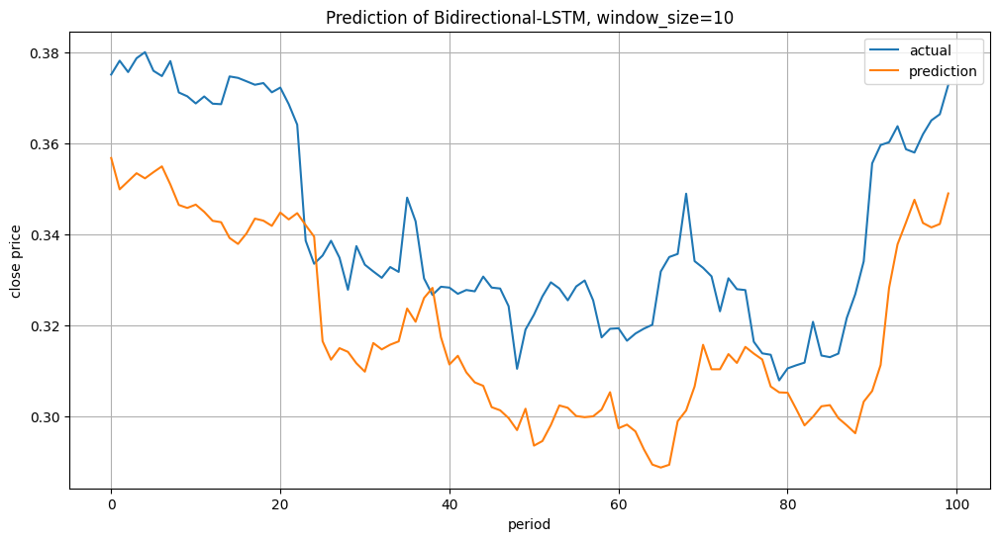

In [32]:
pred = bilstm_model.predict(X_test)
plt.figure(figsize=(12, 6))
plt.title('Prediction of Bidirectional-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_test, label='actual')
plt.plot(pred, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()
#Graph with scaled X and y

In [33]:
# Calculate metrics
rmse = np.sqrt(mean_squared_error(y_test, pred))
mae = mean_absolute_error(y_test, pred)
mape = mean_absolute_percentage_error(y_test, pred)

print("RMSE:", rmse)
print("MAE:", mae)
print("MAPE :", mape)

RMSE: 0.024174472774656192
MAE: 0.022043680498153105
MAPE : 0.06415296897244768


In [34]:
#Inverse transformation to extract the real value from the scaled value
y_pred_original = y_scaler.inverse_transform(pred)
y_test_original = y_scaler.inverse_transform(y_test)

In [35]:
y_pred_original

array([[1770.9436],
       [1738.3531],
       [1746.7179],
       [1755.1117],
       [1749.7799],
       [1756.212 ],
       [1762.2489],
       [1743.3757],
       [1722.0828],
       [1719.009 ],
       [1722.4564],
       [1714.9266],
       [1705.5874],
       [1704.1659],
       [1687.7477],
       [1681.555 ],
       [1692.4412],
       [1707.8956],
       [1705.7657],
       [1700.3688],
       [1714.1799],
       [1707.0608],
       [1713.566 ],
       [1701.0829],
       [1689.1793],
       [1580.3647],
       [1561.1367],
       [1573.1141],
       [1569.2882],
       [1557.3826],
       [1548.6705],
       [1578.4767],
       [1571.8391],
       [1576.745 ],
       [1580.1772],
       [1614.3502],
       [1600.5859],
       [1625.3104],
       [1635.8292],
       [1584.4779],
       [1556.1638],
       [1565.1707],
       [1547.9952],
       [1537.551 ],
       [1533.9537],
       [1511.7389],
       [1508.4865],
       [1500.3973],
       [1487.8855],
       [1510.1202],


In [36]:
y_test_original

array([[1857.74194336],
       [1872.15991211],
       [1860.35717773],
       [1874.74487305],
       [1881.06884766],
       [1861.64379883],
       [1856.16235352],
       [1871.79211426],
       [1839.08972168],
       [1835.13647461],
       [1827.71289062],
       [1834.98791504],
       [1827.46203613],
       [1826.93884277],
       [1855.80737305],
       [1854.29760742],
       [1850.75341797],
       [1847.12438965],
       [1848.88989258],
       [1839.28015137],
       [1844.18579102],
       [1826.93273926],
       [1805.65905762],
       [1684.93347168],
       [1660.94506836],
       [1669.47192383],
       [1684.85205078],
       [1667.26904297],
       [1633.89257812],
       [1679.27441406],
       [1659.94458008],
       [1652.93505859],
       [1646.3067627 ],
       [1657.51306152],
       [1652.45739746],
       [1729.72570801],
       [1705.11218262],
       [1645.63916016],
       [1628.49121094],
       [1637.02539062],
       [1636.11767578],
       [1629.655

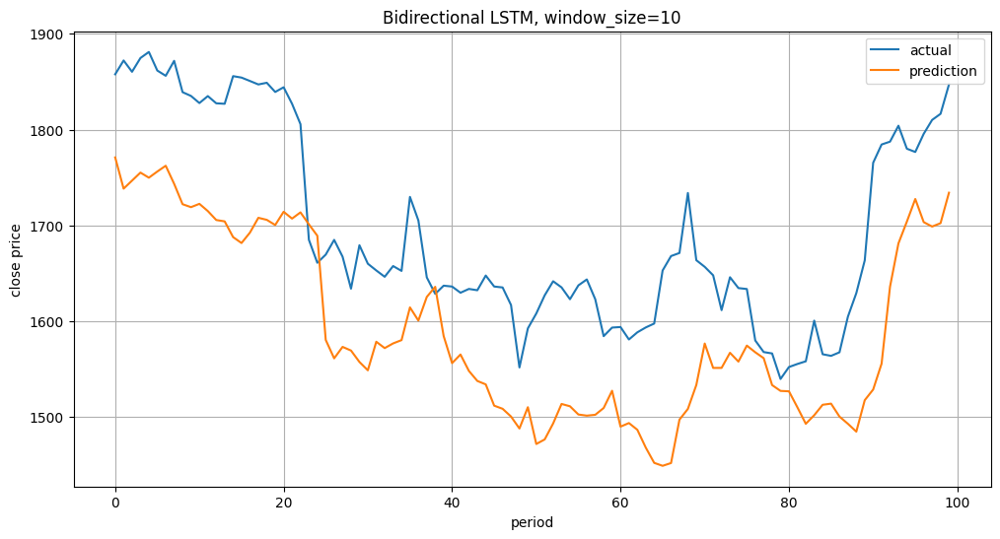

In [37]:
#Real values of prediction
plt.figure(figsize=(12, 6))
plt.title('Bidirectional LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_test_original, label='actual')
plt.plot(y_pred_original, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()

In [38]:
# Calculate metrics with the real number value
real_rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_original))
real_mae = mean_absolute_error(y_test_original, y_pred_original)
real_mape = mean_absolute_percentage_error(y_test_original, y_pred_original)
#Print each value
print("RMSE:", real_rmse)
print("MAE:",real_mae)
print("MAPE :", real_mape)

RMSE: 114.29151575258184
MAE: 104.21760009765624
MAPE : 0.06097689676760656


In [39]:
df_reset = df.reset_index()

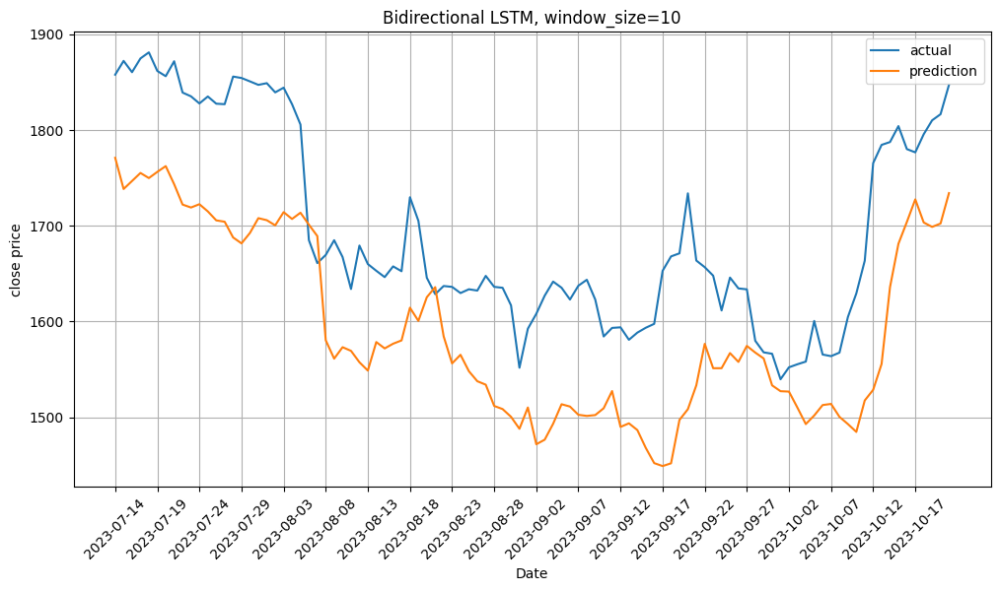

In [40]:
# Plotting
date_values_bi = df_reset['Date'].iloc[test_index].values
plt.figure(figsize=(12, 6))
plt.title('Bidirectional LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('Date')
plt.plot(date_values_bi, y_test_original, label='actual')
plt.plot(date_values_bi, y_pred_original, label='prediction')

# Choose to show every 5th date value for better visualization
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.grid()
plt.legend(loc='best')
plt.show()


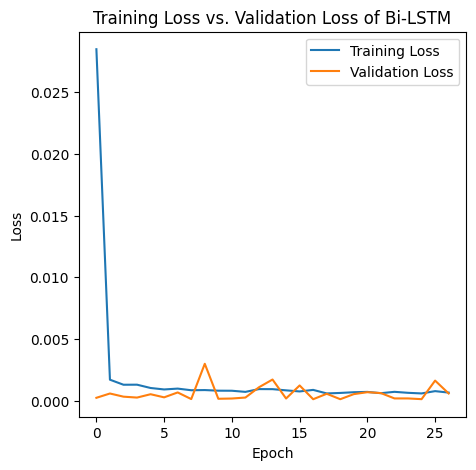

In [41]:
# Plot the training loss and validation loss over the epochs when X,y scaled
plt.figure(figsize=(5, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Training Loss vs. Validation Loss of Bi-LSTM')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training Loss', 'Validation Loss'], loc='upper right')
plt.show()

In [42]:
# Use the training data for deep explainer => can use fewer instances
explainer_stock = shap.DeepExplainer(bilstm_model, X_train)
shap_values_stock = explainer_stock.shap_values(X_test)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [43]:
shap.initjs()

In [44]:
shap_values_stock[0][0].shape

(10, 51)

In [45]:
X_test.shape

(100, 10, 51)

In [46]:
print(shap_values_stock[0].shape)
print(X_test.shape)


(100, 10, 51)
(100, 10, 51)


In [47]:
shap_values_2D = shap_values_stock[0].reshape(-1, 51)
X_test_2D = X_test.reshape(-1, 51)

shap_values_2D.shape, X_test_2D.shape

((1000, 51), (1000, 51))

In [48]:
features  = df.columns[:-1]
#features = df.columns
XX = df[features]

In [49]:
mapping_dict = {f: column_name for f, column_name in zip(features, XX.columns)}

actual_column_names = [mapping_dict[feature_name] for feature_name in features]

In [50]:
x_test_2d = pd.DataFrame(data=X_test_2D, columns = actual_column_names)

In [51]:
x_test_2d.corr()

,Open,High,Low,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,btc-usd_Adj Close,btc-usd_Volume,cl=f_Open,...,day_n_shares,FEDFUNDS,Pct_change,MACD,Signal Line,Volatility,Middle Band,Std Dev,Upper Band,Lower Band
Open,1.000000,0.980937,0.964658,0.701484,0.605316,0.666275,0.617906,0.617906,0.032503,-0.642841,...,0.145420,-0.622660,-0.178908,0.503432,0.605151,-0.256332,0.889171,-0.210359,0.788926,0.879428
High,0.980937,1.000000,0.961775,0.725947,0.675108,0.701199,0.681813,0.681813,0.142775,-0.608535,...,0.190354,-0.618219,-0.029180,0.535494,0.613326,-0.230535,0.857823,-0.186633,0.766898,0.843001
Low,0.964658,0.961775,1.000000,0.683875,0.604440,0.703301,0.646613,0.646613,-0.059556,-0.601615,...,0.033255,-0.632459,0.022842,0.511261,0.598988,-0.277723,0.862607,-0.232281,0.755351,0.862534
btc-usd_Open,0.701484,0.725947,0.683875,1.000000,0.960038,0.974781,0.959003,0.959003,0.249106,-0.323928,...,0.154601,-0.397113,-0.035573,0.823685,0.789567,-0.135141,0.417006,-0.070223,0.380078,0.402983
btc-usd_High,0.605316,0.675108,0.604440,0.960038,1.000000,0.950119,0.985642,0.985642,0.423895,-0.239136,...,0.206089,-0.338364,0.149351,0.804763,0.733519,-0.080428,0.317096,-0.028567,0.297824,0.298176
btc-usd_Low,0.666275,0.701199,0.703301,0.974781,0.950119,1.000000,0.977813,0.977813,0.157242,-0.281268,...,0.055584,-0.405178,0.117485,0.830586,0.784458,-0.151720,0.386633,-0.092536,0.342665,0.382751
btc-usd_Close,0.617906,0.681813,0.646613,0.959003,0.985642,0.977813,1.000000,1.000000,0.309019,-0.246895,...,0.127249,-0.360320,0.212780,0.815661,0.750845,-0.105226,0.338143,-0.045515,0.312253,0.322972
btc-usd_Adj Close,0.617906,0.681813,0.646613,0.959003,0.985642,0.977813,1.000000,1.000000,0.309019,-0.246895,...,0.127249,-0.360320,0.212780,0.815661,0.750845,-0.105226,0.338143,-0.045515,0.312253,0.322972
btc-usd_Volume,0.032503,0.142775,-0.059556,0.249106,0.423895,0.157242,0.309019,0.309019,1.000000,0.002365,...,0.561793,0.130770,0.095783,0.090230,0.012372,0.151863,-0.049468,0.235531,0.035506,-0.123352
cl=f_Open,-0.642841,-0.608535,-0.601615,-0.323928,-0.239136,-0.281268,-0.246895,-0.246895,0.002365,1.000000,...,-0.090405,0.556158,0.189913,-0.050221,-0.326170,-0.140701,-0.801901,-0.325738,-0.894337,-0.621719


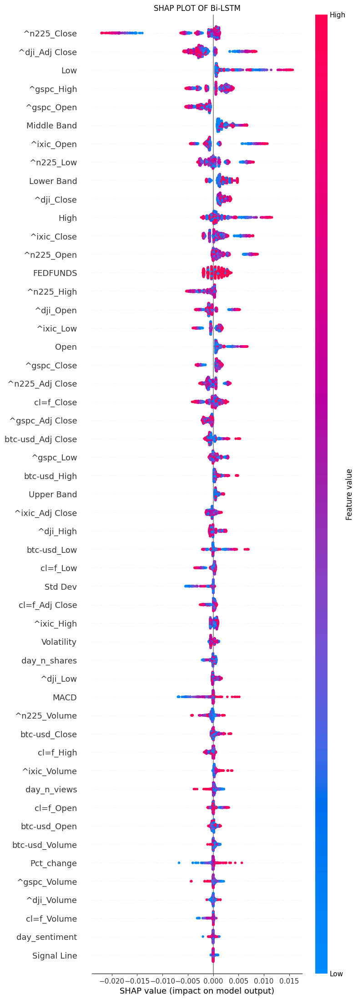

In [52]:
max_display_features = 51  # Replace with the number of features you want to display
shap.summary_plot(shap_values_2D, x_test_2d, max_display=max_display_features, show=False)
plt.title("SHAP PLOT OF Bi-LSTM", loc='center')
plt.show()

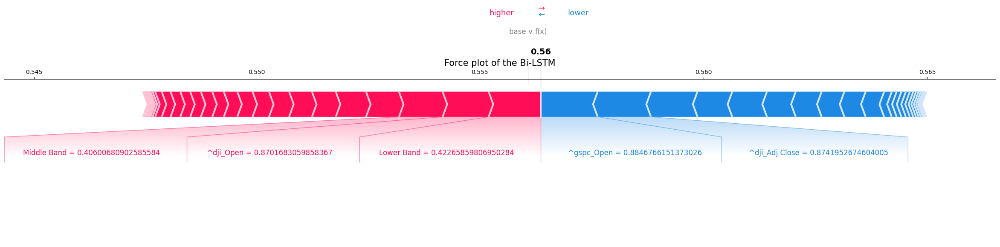

In [53]:
#Obtain Force Plot
expected_value_bi = explainer_stock.expected_value[0]

instance_index = 0

shap.force_plot(expected_value_bi, shap_values_2D[instance_index], x_test_2d.iloc[instance_index],
                link='logit', matplotlib=True, show = False,figsize=(30,5))

plt.title("Force plot of the Bi-LSTM",fontsize=15)
plt.show()

In [54]:
#expected_value_bi = explainer_stock.expected_value[0]

#for instance_index in range(len(x_test_2d)):
 #   shap.force_plot(expected_value_bi, shap_values_2D[instance_index],
  #                  x_test_2d.iloc[instance_index], link='logit',
   #                 matplotlib=True, show=False, figsize=(30, 5))

   # plt.title(f"Force plot for Instance {instance_index}", fontsize=15)
    #plt.show()


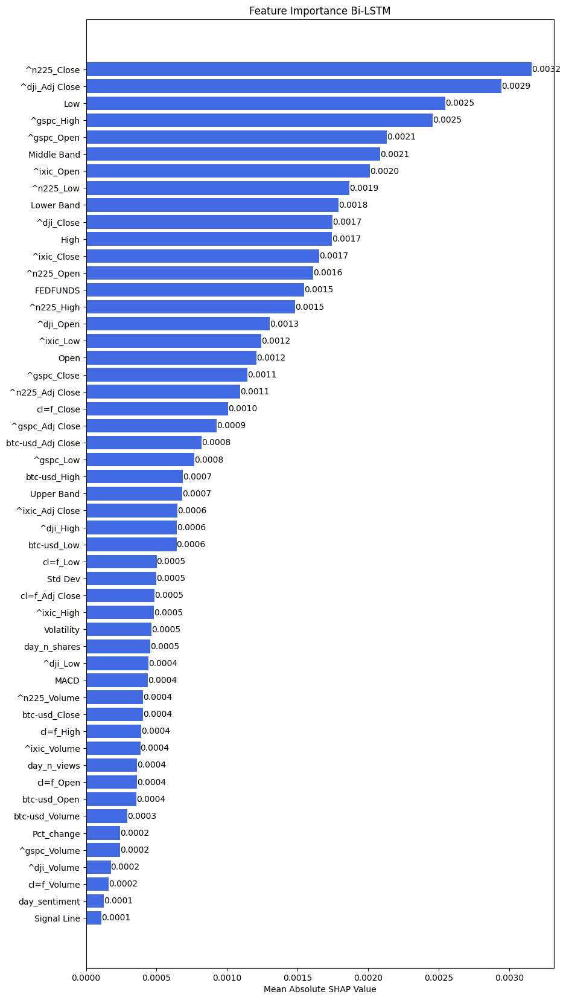

In [55]:
# Compute the mean absolute SHAP values for each feature
mean_shap_values_bi = np.abs(shap_values_2D).mean(axis=0)

# Sorting the features based on their mean absolute SHAP values
sorted_indices_bi = np.argsort(mean_shap_values_bi)[::-1]
sorted_features_bi = x_test_2d.columns[sorted_indices_bi]
sorted_shap_values_bi = mean_shap_values_bi[sorted_indices_bi]

# Create the bar plot
plt.figure(figsize=(10, len(sorted_features_bi) * 0.4))
plt.barh(sorted_features_bi, sorted_shap_values_bi, color='royalblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance Bi-LSTM')

# Annotate each bar with its exact value
for index, value in enumerate(sorted_shap_values_bi):
    plt.text(value, index, f'{value:.4f}', va='center')

plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

# Building Single Layered LSTM model

In [56]:
def build_single_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(128, return_sequences=False, input_shape= input_shape))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [57]:
input_shape = (X_train.shape[1], X_train.shape[2])
single_lstm_model = build_single_lstm_model(input_shape)
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min')
# Train the model

single_history = single_lstm_model.fit(X_train, y_train, epochs=50, batch_size=32,
                    validation_data=(X_test, y_test), callbacks=[early_stopping])

Train on 2053 samples, validate on 100 samples
Epoch 1/50
2053/2053 [==============================] - 1s 688us/sample - loss: 0.0201 - val_loss: 0.0021
Epoch 2/50
 192/2053 [=>............................] - ETA: 0s - loss: 0.0026

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


2053/2053 [==============================] - 1s 385us/sample - loss: 0.0015 - val_loss: 9.5336e-04
Epoch 3/50
2053/2053 [==============================] - 1s 396us/sample - loss: 0.0011 - val_loss: 0.0012
Epoch 4/50
2053/2053 [==============================] - 1s 390us/sample - loss: 0.0011 - val_loss: 0.0025
Epoch 5/50
2053/2053 [==============================] - 1s 396us/sample - loss: 0.0010 - val_loss: 4.0977e-04
Epoch 6/50
2053/2053 [==============================] - 1s 383us/sample - loss: 9.9132e-04 - val_loss: 1.6055e-04
Epoch 7/50
2053/2053 [==============================] - 1s 390us/sample - loss: 9.3128e-04 - val_loss: 1.7793e-04
Epoch 8/50
2053/2053 [==============================] - 1s 650us/sample - loss: 9.4560e-04 - val_loss: 0.0024
Epoch 9/50
2053/2053 [==============================] - 1s 682us/sample - loss: 0.0010 - val_loss: 4.7904e-04
Epoch 10/50
2053/2053 [==============================] - 1s 386us/sample - loss: 7.4489e-04 - val_loss: 1.3891e-04
Epoch 11/50
2053

In [58]:
single_lstm_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 128)               92160     
                                                                 
 dense_2 (Dense)             (None, 25)                3225      
                                                                 
 dense_3 (Dense)             (None, 1)                 26        
                                                                 
Total params: 95411 (372.70 KB)
Trainable params: 95411 (372.70 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


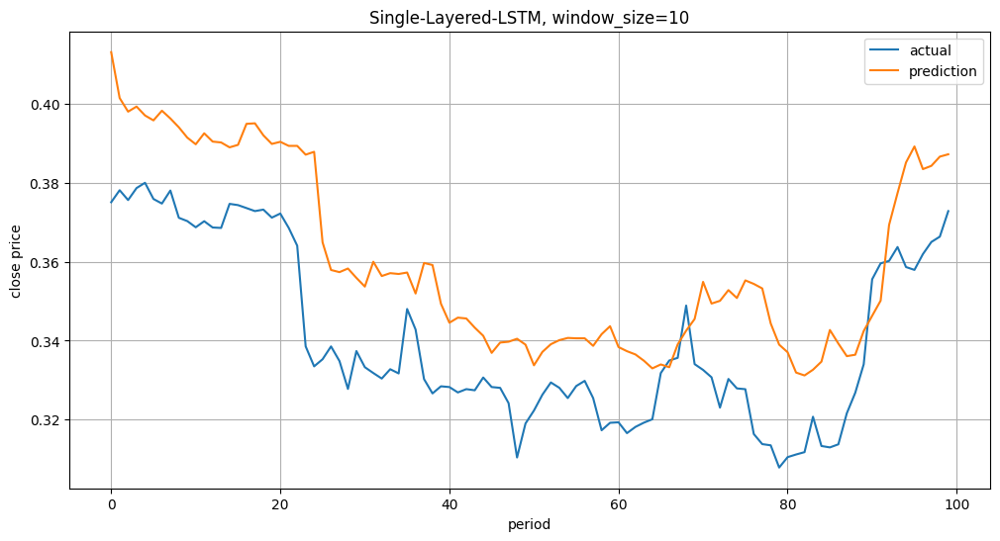

In [59]:
single_pred = single_lstm_model.predict(X_test)
plt.figure(figsize=(12, 6))
plt.title('Single-Layered-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_test, label='actual')
plt.plot(single_pred, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()


In [60]:
y_single_pred_original = y_scaler.inverse_transform(single_pred)
y_single_test_original = y_scaler.inverse_transform(y_test)

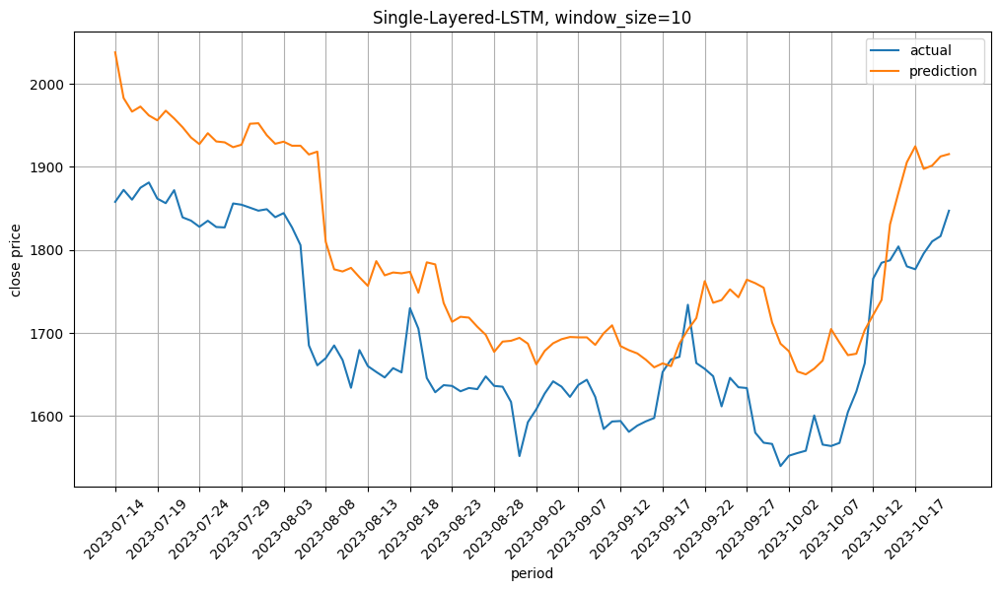

In [61]:
## Real values of prediction
plt.figure(figsize=(12, 6))
plt.title('Single-Layered-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(date_values_bi,y_single_test_original, label='actual')
plt.plot(date_values_bi,y_single_pred_original, label='prediction')
plt.grid()
plt.legend(loc='best')
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.show()

In [62]:
# Calculate error metrics
real_rmse_single = np.sqrt(mean_squared_error(y_single_test_original, y_single_pred_original))
real_mae_single = mean_absolute_error(y_single_test_original, y_single_pred_original)
real_mape_single = mean_absolute_percentage_error(y_single_test_original, y_single_pred_original)

# Print each value
print("RMSE of Single-Layered-LSTM :", real_rmse_single)
print("MAE of Single-Layered-LSTM :", real_mae_single)
print("MAPE of Single-Layered-LSTM :", real_mape_single)

RMSE of Single-Layered-LSTM : 103.5572442210539
MAE of Single-Layered-LSTM : 94.76470092773438
MAPE of Single-Layered-LSTM : 0.05624485006180655


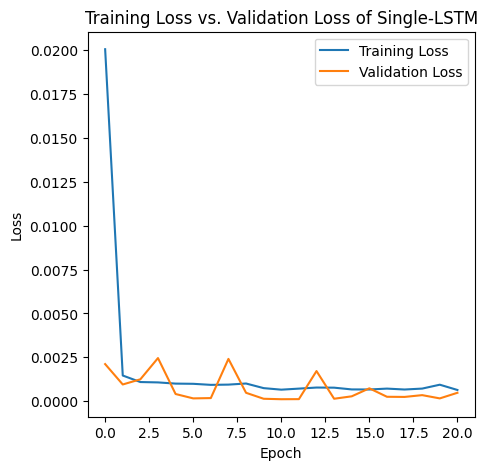

In [63]:
# Plot the training loss and validation loss over the epochs
plt.figure(figsize=(5, 5))
plt.plot(single_history.history['loss'])
plt.plot(single_history.history['val_loss'])
plt.title('Training Loss vs. Validation Loss of Single-LSTM')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training Loss', 'Validation Loss'], loc='upper right')
plt.show()

# SHAP for Single Layer

In [64]:
# Use the training data for deep explainer
explainer_stock_single = shap.DeepExplainer(single_lstm_model, X_train)
shap_values_stock_single = explainer_stock_single.shap_values(X_test)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [65]:
shap_values_stock_single[0][0].shape

(10, 51)

In [66]:
shap_values_single_2D = shap_values_stock_single[0].reshape(-1,51)
X_test_single_2D = X_test.reshape(-1,51)

shap_values_single_2D.shape, X_test_single_2D.shape

((1000, 51), (1000, 51))

In [67]:
X_test_single_2D

array([[0.40657876, 0.40381109, 0.39232994, ..., 0.06256369, 0.38727282,
        0.4226586 ],
       [0.39249508, 0.38712783, 0.39811741, ..., 0.06352472, 0.38786007,
        0.42272237],
       [0.3909113 , 0.38629804, 0.39576729, ..., 0.06248009, 0.3882365 ,
        0.42383917],
       ...,
       [0.35884031, 0.35687338, 0.36473149, ..., 0.14570225, 0.35702762,
        0.33344193],
       [0.35809541, 0.35892968, 0.36313854, ..., 0.15263562, 0.36118525,
        0.33380968],
       [0.36212122, 0.36283302, 0.36601037, ..., 0.15828287, 0.36526254,
        0.33491677]])

In [68]:
features  = df.columns[:-1]
#features = df.columns
XX = df[features]

In [69]:
mapping_dict = {f: column_name for f, column_name in zip(features, XX.columns)}
actual_column_names = [mapping_dict[feature_name] for feature_name in features]

In [70]:
x_test_single_2d = pd.DataFrame(data=X_test_single_2D, columns = actual_column_names)

In [71]:
actual_column_names

['Open',
 'High',
 'Low',
 'btc-usd_Open',
 'btc-usd_High',
 'btc-usd_Low',
 'btc-usd_Close',
 'btc-usd_Adj Close',
 'btc-usd_Volume',
 'cl=f_Open',
 'cl=f_High',
 'cl=f_Low',
 'cl=f_Close',
 'cl=f_Adj Close',
 'cl=f_Volume',
 '^dji_Open',
 '^dji_High',
 '^dji_Low',
 '^dji_Close',
 '^dji_Adj Close',
 '^dji_Volume',
 '^gspc_Open',
 '^gspc_High',
 '^gspc_Low',
 '^gspc_Close',
 '^gspc_Adj Close',
 '^gspc_Volume',
 '^ixic_Open',
 '^ixic_High',
 '^ixic_Low',
 '^ixic_Close',
 '^ixic_Adj Close',
 '^ixic_Volume',
 '^n225_Open',
 '^n225_High',
 '^n225_Low',
 '^n225_Close',
 '^n225_Adj Close',
 '^n225_Volume',
 'day_sentiment',
 'day_n_views',
 'day_n_shares',
 'FEDFUNDS',
 'Pct_change',
 'MACD',
 'Signal Line',
 'Volatility',
 'Middle Band',
 'Std Dev',
 'Upper Band',
 'Lower Band']

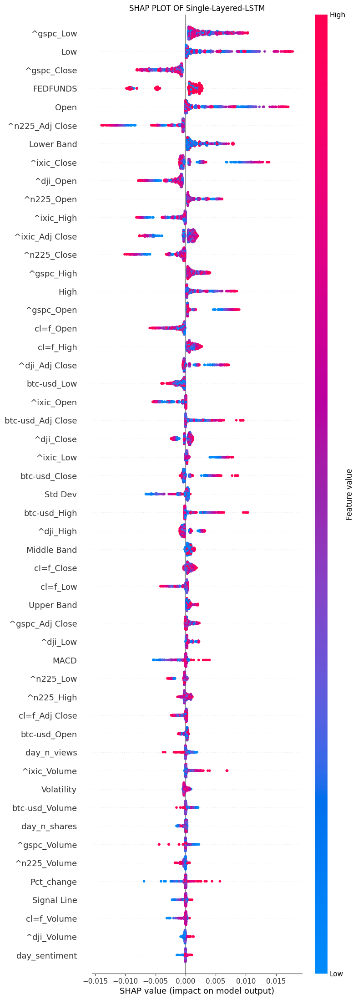

In [72]:
shap.summary_plot(shap_values_single_2D, x_test_single_2d, max_display=max_display_features, show = False)
plt.title("SHAP PLOT OF Single-Layered-LSTM", loc='center')
plt.show()

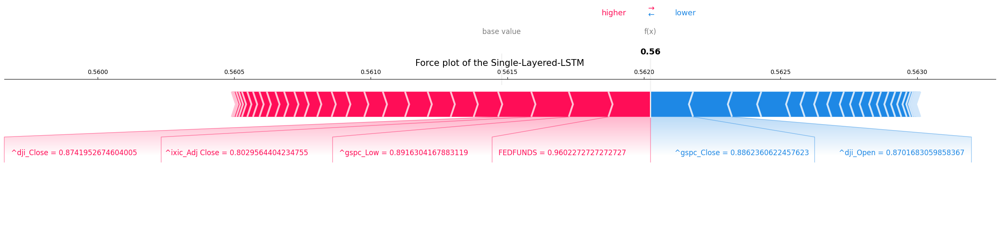

In [73]:
#Obtain Force Plot
expected_value_single = explainer_stock_single.expected_value[0]

instance_index = 0

shap.force_plot(expected_value_single, shap_values_single_2D[instance_index], x_test_single_2d.iloc[instance_index],
                link='logit', matplotlib=True, show = False,figsize=(30,5))

plt.title("Force plot of the Single-Layered-LSTM", fontsize=15)
plt.show()

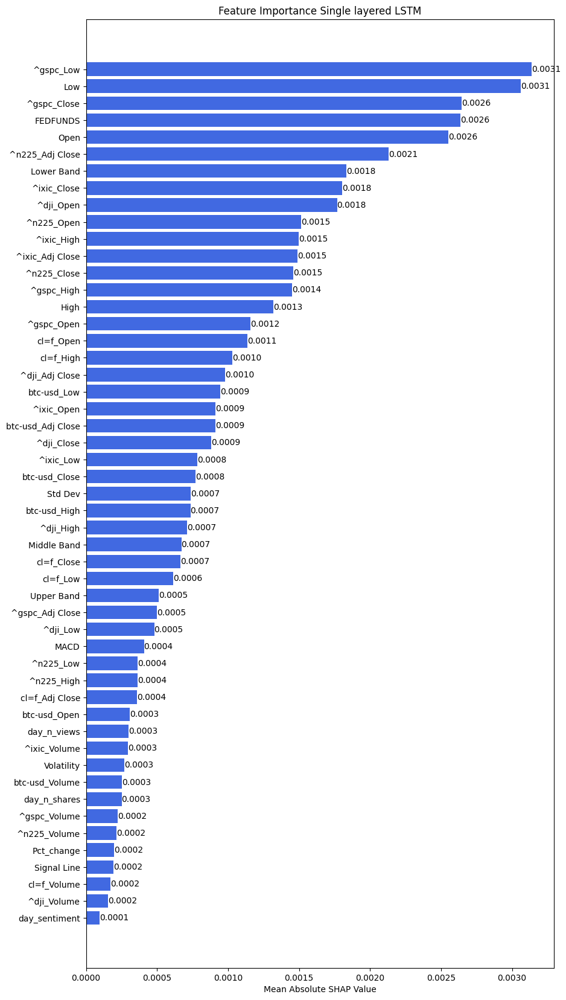

In [74]:
# Compute the mean absolute SHAP values for each feature
mean_shap_values_sin = np.abs(shap_values_single_2D).mean(axis=0)

# Sorting the features based on their mean absolute SHAP values
sorted_indices_sin = np.argsort(mean_shap_values_sin)[::-1]
sorted_features_sin = x_test_single_2d.columns[sorted_indices_sin]
sorted_shap_values_sin = mean_shap_values_sin[sorted_indices_sin]

# Create the bar plot
plt.figure(figsize=(10, len(sorted_features_sin) * 0.4))
plt.barh(sorted_features_sin, sorted_shap_values_sin, color='royalblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance Single layered LSTM')

# Annotate each bar with its exact value
for index, value in enumerate(sorted_shap_values_sin):
    plt.text(value, index, f'{value:.4f}', va='center')

plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

# Testing with PCA data

In [75]:
# Assuming 'data01.csv' contains your data
df_pca = pd.read_csv("data01.csv")

# Define a dictionary with the new column names
new_column_names = {
    'date': 'Date',
    'eth-usd_Open': 'Open',
    'eth-usd_High': 'High',
    'eth-usd_Low': 'Low',
    'eth-usd_Close': 'Close',
    'eth-usd_Adj Close': 'Adj Close',
    'eth-usd_Volume': 'Volume'
}
# Rename the columns using the dictionary
df_pca.rename(columns=new_column_names, inplace=True)

# Set 'date' as the index
df_pca.set_index('Date', inplace=True)

# Now, your DataFrame has the updated column names and 'date' as the index
df.head()



,Open,High,Low,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,btc-usd_Adj Close,btc-usd_Volume,cl=f_Open,...,FEDFUNDS,Pct_change,MACD,Signal Line,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-29,473.281006,522.307007,425.071014,10077.400391,11517.400391,9601.030273,9888.610352,9888.610352,11568799744,57.730000,...,1.16,-0.100880,37.185784,28.226306,0.846353,379.305402,63.888660,507.082721,251.528082,447.114014
2017-11-30,431.214996,465.497009,401.243011,9906.790039,10801.000000,9202.049805,10233.599609,10233.599609,8310689792,57.410000,...,1.16,0.044806,36.310079,29.843061,0.791214,386.698453,62.681287,512.061027,261.335879,466.540009
2017-12-01,445.209015,472.609009,428.312012,10198.599609,11046.700195,9694.650391,10975.599609,10975.599609,6783119872,57.419998,...,1.30,0.042530,36.759847,31.226418,0.787766,394.291403,62.696023,519.683448,268.899358,463.449005
2017-12-02,466.851013,476.239014,456.653015,10978.299805,11320.200195,10905.099609,11074.599609,11074.599609,5138500096,57.419998,...,1.30,-0.006647,36.446739,32.270482,0.778998,402.068454,61.041859,524.152173,279.984735,465.852997
2017-12-03,463.704987,482.813995,451.851990,11082.700195,11858.700195,10862.000000,11323.200195,11323.200195,6608309760,57.419998,...,1.30,0.005174,35.977849,33.011956,0.780244,409.525304,59.146294,527.817892,291.232715,470.204010


In [76]:
df_pca_reset = df_pca.reset_index()

In [77]:
#Making the percentage changes in each day
df_pca['Pct_change'] = df_pca['Close'].pct_change()
# data['Pct_change'] = np.log(1+data['Pct_change'])
df_pca['Pct_change'] = np.log1p(df_pca['Pct_change'])
# Choose the desired time periods for the moving averages
short_period = 12  # Short-term EMA period
long_period = 26  # Long-term EMA period
signal_period = 9  # Signal line EMA period

# Calculate the short-term EMA
df_pca['Short EMA'] = df_pca['Close'].ewm(span=short_period, adjust=False).mean()

# Calculate the long-term EMA
df_pca['Long EMA'] = df_pca['Close'].ewm(span=long_period, adjust=False).mean()

# Calculate the MACD line
df_pca['MACD'] = df_pca['Short EMA'] - df_pca['Long EMA']

# Calculate the signal line
df_pca['Signal Line'] = df_pca['MACD'].ewm(span=signal_period, adjust=False).mean()

# Calculate the MACD histogram
df_pca['MACD Histogram'] = df_pca['MACD'] - df_pca['Signal Line']
# Choose the desired time period for the moving average and standard deviation
window = 20  # Number of Trading days in a month
num_std = 2
# 2 standard deviations above and below the middle band provides
#a range that encompasses a large portion of typical price movements

# Calculate the logarithmic returns
df_pca['Log Returns'] = np.log(df_pca['Close'] / df_pca['Close'].shift(1))

# Calculate the volatility
df_pca['Volatility'] = df_pca['Log Returns'].rolling(window=20).std() * np.sqrt(252)

# Calculate the middle band (simple moving average)
df_pca['Middle Band'] = df_pca['Close'].rolling(window=window).mean()

# Calculate the standard deviation of the closing prices
df_pca['Std Dev'] = df_pca['Close'].rolling(window=window).std()

# Calculate the upper band and lower band
df_pca['Upper Band'] = df_pca['Middle Band'] + (num_std * df_pca['Std Dev'])
df_pca['Lower Band'] = df_pca['Middle Band'] - (num_std * df_pca['Std Dev'])

#Making Next day's close price column in each date.
df_pca['Next_day'] = df_pca['Close'].shift(-1)


# Display the updated DataFrame with the Bollinger Bands columns
df_pca

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,299.252991
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,-1.725551,-0.345110,-1.380441,-0.069790,NaN,NaN,NaN,NaN,NaN,314.681000
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,-1.827089,-0.641506,-1.185583,0.050270,NaN,NaN,NaN,NaN,NaN,307.907990
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,-2.426118,-0.998428,-1.427690,-0.021758,NaN,NaN,NaN,NaN,NaN,316.716003
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,-2.165161,-1.231775,-0.933386,0.028204,NaN,NaN,NaN,NaN,NaN,337.631012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,34089.574219,...,45.485737,22.846100,22.639636,-0.001927,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,34538.480469,...,48.428640,27.962608,20.466032,0.010598,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623
2023-10-30,1795.589111,1829.249512,1779.364502,1810.088623,1810.088623,7.534051e+09,34531.742188,34843.933594,34110.972656,34502.363281,...,51.342534,32.638593,18.703940,0.008067,0.279047,1663.471027,108.299164,1880.069355,1446.872698,1816.458984


In [78]:
df_pca.isnull().sum()

Open                  0
High                  0
Low                   0
Close                 0
Adj Close             0
Volume                0
btc-usd_Open          0
btc-usd_High          0
btc-usd_Low           0
btc-usd_Close         0
btc-usd_Adj Close     0
btc-usd_Volume        0
cl=f_Open             0
cl=f_High             0
cl=f_Low              0
cl=f_Close            0
cl=f_Adj Close        0
cl=f_Volume           0
^dji_Open             0
^dji_High             0
^dji_Low              0
^dji_Close            0
^dji_Adj Close        0
^dji_Volume           0
^gspc_Open            0
^gspc_High            0
^gspc_Low             0
^gspc_Close           0
^gspc_Adj Close       0
^gspc_Volume          0
^ixic_Open            0
^ixic_High            0
^ixic_Low             0
^ixic_Close           0
^ixic_Adj Close       0
^ixic_Volume          0
^n225_Open            0
^n225_High            0
^n225_Low             0
^n225_Close           0
^n225_Adj Close       0
^n225_Volume    

In [79]:
df_pca=df_pca.dropna()

# Making PCA dataset

In [80]:
scaler = MinMaxScaler()

scale_cols = ['Open', 'High', 'Low', 'btc-usd_Open', 'btc-usd_High', 'btc-usd_Low',
       'btc-usd_Close', 'btc-usd_Adj Close', 'btc-usd_Volume', 'cl=f_Open',
       'cl=f_High', 'cl=f_Low', 'cl=f_Close', 'cl=f_Adj Close', 'cl=f_Volume',
       '^dji_Open', '^dji_High', '^dji_Low', '^dji_Close', '^dji_Adj Close',
       '^dji_Volume', '^gspc_Open', '^gspc_High', '^gspc_Low', '^gspc_Close',
       '^gspc_Adj Close', '^gspc_Volume', '^ixic_Open', '^ixic_High',
       '^ixic_Low', '^ixic_Close', '^ixic_Adj Close', '^ixic_Volume',
       '^n225_Open', '^n225_High', '^n225_Low', '^n225_Close',
       '^n225_Adj Close', '^n225_Volume', 'day_sentiment', 'day_n_views',
       'day_n_shares', 'FEDFUNDS', 'Pct_change', 'MACD', 'Signal Line',
       'Volatility', 'Middle Band', 'Std Dev', 'Upper Band', 'Lower Band','Next_day']

scaled_df_pca = scaler.fit_transform(df_pca[scale_cols])

scaled_df_pca = pd.DataFrame(scaled_df_pca, columns=scale_cols)

print(scaled_df_pca)

          Open      High       Low  btc-usd_Open  btc-usd_High  btc-usd_Low  \
0     0.082315  0.090914  0.073835      0.106372      0.125805     0.101435   
1     0.073413  0.079094  0.068694      0.103719      0.114870     0.095121   
2     0.076374  0.080574  0.074534      0.108256      0.118620     0.102916   
3     0.080954  0.081329  0.080649      0.120380      0.122795     0.122072   
4     0.080288  0.082697  0.079613      0.122003      0.131015     0.121390   
...        ...       ...       ...           ...           ...          ...   
2158  0.363858  0.357608  0.359986      0.480774      0.472612     0.478323   
2159  0.358840  0.356873  0.364731      0.476906      0.475072     0.485569   
2160  0.358095  0.358930  0.363139      0.479730      0.480321     0.486721   
2161  0.362121  0.362833  0.366010      0.486608      0.481858     0.489307   
2162  0.365198  0.360903  0.367133      0.486116      0.479955     0.488869   

      btc-usd_Close  btc-usd_Adj Close  btc-usd_Vol

In [81]:
from sklearn.decomposition import PCA

In [82]:
scaled_df_pca

,Open,High,Low,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,btc-usd_Adj Close,btc-usd_Volume,cl=f_Open,...,FEDFUNDS,Pct_change,MACD,Signal Line,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
0,0.082315,0.090914,0.073835,0.106372,0.125805,0.101435,0.103402,0.103402,0.024839,0.517309,...,0.210227,0.572715,0.463765,0.465773,0.324340,0.063604,0.091845,0.080644,0.045277,0.076739
1,0.073413,0.079094,0.068694,0.103719,0.114870,0.095121,0.108765,0.108765,0.015478,0.515001,...,0.210227,0.758190,0.462639,0.468150,0.299866,0.065271,0.090039,0.081676,0.047654,0.080848
2,0.076374,0.080574,0.074534,0.108256,0.118620,0.102916,0.120299,0.120299,0.011089,0.515073,...,0.236742,0.755293,0.463217,0.470183,0.298335,0.066983,0.090061,0.083256,0.049486,0.080194
3,0.080954,0.081329,0.080649,0.120380,0.122795,0.122072,0.121838,0.121838,0.006364,0.515073,...,0.236742,0.692684,0.462815,0.471717,0.294444,0.068737,0.087586,0.084182,0.052172,0.080703
4,0.080288,0.082697,0.079613,0.122003,0.131015,0.121390,0.125702,0.125702,0.010587,0.515073,...,0.236742,0.707734,0.462212,0.472807,0.294997,0.070419,0.084750,0.084942,0.054898,0.081623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2158,0.363858,0.357608,0.359986,0.480774,0.472612,0.478323,0.476807,0.476807,0.038772,0.703375,...,1.000000,0.684101,0.471231,0.449548,0.089019,0.346425,0.137815,0.353359,0.334264,0.357950
2159,0.358840,0.356873,0.364731,0.476906,0.475072,0.485569,0.479602,0.479602,0.020792,0.703375,...,1.000000,0.698694,0.474432,0.457866,0.089156,0.348038,0.145702,0.357028,0.333442,0.361954
2160,0.358095,0.358930,0.363139,0.479730,0.480321,0.486721,0.486580,0.486580,0.023666,0.703375,...,1.000000,0.714639,0.478214,0.465386,0.074708,0.350471,0.152636,0.361185,0.333810,0.365030
2161,0.362121,0.362833,0.366010,0.486608,0.481858,0.489307,0.486018,0.486018,0.040975,0.713977,...,1.000000,0.711417,0.481959,0.472258,0.072533,0.353204,0.158283,0.365263,0.334917,0.366377


In [83]:
pca = PCA()
X_pca = pca.fit_transform(scaled_df_pca)
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

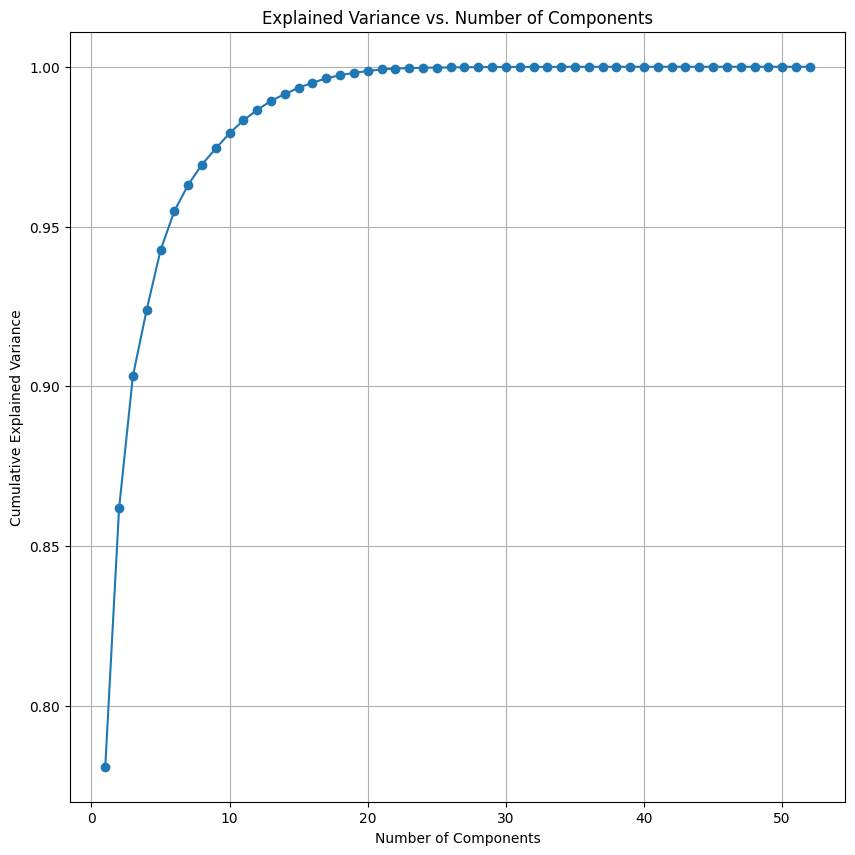

In [84]:
# Plot the cumulative explained variance against the number of components
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

In [85]:
n_components = 6
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(scaled_df_pca)

In [86]:
features = df_pca.columns[:-1]

In [87]:
features = df.columns[:-1]

In [88]:
# Access the principal components
principal_components = pca.components_

# Access the explained variance of each principal component
explained_variances = pca.explained_variance_ratio_

# Print the explained variance of each principal component
for i, explained_variance in enumerate(explained_variances):
    print(f"Principal Component {i+1}: {explained_variance:.4f}")

# Print the loadings of the original features on each principal component
for i, pc in enumerate(principal_components):
    print(f"Principal Component {i+1} Loadings:")
    for feature, loading in zip(features, pc):
        print(f"{feature}: {loading:.4f}")

Principal Component 1: 0.7810
Principal Component 2: 0.0808
Principal Component 3: 0.0414
Principal Component 4: 0.0208
Principal Component 5: 0.0185
Principal Component 6: 0.0123
Principal Component 1 Loadings:
Open: 0.1645
High: 0.1662
Low: 0.1624
btc-usd_Open: 0.1694
btc-usd_High: 0.1700
btc-usd_Low: 0.1680
btc-usd_Close: 0.1692
btc-usd_Adj Close: 0.1692
btc-usd_Volume: 0.0162
cl=f_Open: 0.0595
cl=f_High: 0.0721
cl=f_Low: 0.0505
cl=f_Close: 0.0516
cl=f_Adj Close: 0.0516
cl=f_Volume: -0.0351
^dji_Open: 0.1667
^dji_High: 0.1658
^dji_Low: 0.1600
^dji_Close: 0.1622
^dji_Adj Close: 0.1622
^dji_Volume: -0.0067
^gspc_Open: 0.1981
^gspc_High: 0.1988
^gspc_Low: 0.1917
^gspc_Close: 0.1947
^gspc_Adj Close: 0.1947
^gspc_Volume: 0.0107
^ixic_Open: 0.2006
^ixic_High: 0.2021
^ixic_Low: 0.1997
^ixic_Close: 0.2005
^ixic_Adj Close: 0.2005
^ixic_Volume: 0.0736
^n225_Open: 0.1422
^n225_High: 0.1473
^n225_Low: 0.1419
^n225_Close: 0.1425
^n225_Adj Close: 0.1425
^n225_Volume: -0.0024
day_sentiment: 0.0065

In [89]:
X_pca_df = pd.DataFrame(X_pca)
X_pca_df

,0,1,2,3,4,5
0,-1.500568,-0.226884,-0.257975,-0.122879,0.196756,0.125032
1,-1.479899,-0.216471,-0.230266,-0.027452,0.335846,0.075853
2,-1.467965,-0.186281,-0.257009,-0.144815,0.201367,0.137026
3,-1.454931,-0.175860,-0.276166,-0.141682,0.199920,0.118926
4,-1.452412,-0.184783,-0.272240,-0.148287,0.204153,0.126794
...,...,...,...,...,...,...
2158,1.131085,0.711673,-0.042974,-0.231769,0.311259,0.065813
2159,1.134637,0.708831,-0.047611,-0.236976,0.312653,0.064502
2160,1.141356,0.702995,-0.047870,-0.246963,0.315066,0.066318
2161,1.163489,0.696804,-0.031014,-0.247369,0.384199,0.031278


From this, PCA transformation has been done, based on Elbow plot, it shows that 6 of PCA components can be sufficient amount
# Making as a sequence data and split test and train

In [90]:
# Split x_pca into input sequences and target values
lookback = 10 #Using past 10 days'daily data of below columns'data to predict the 'Next_day' price
data_columns = [ 'Open', 'High', 'Low', 'Pct_change', 'MACD','Signal Line','Volatility' ,'Middle Band', 'Std Dev',
                'Upper Band', 'Lower Band']
target_columns = ['Next_day']

X_p = []
y_p = []
for i in range(len(X_pca) - lookback):
    X_p.append(X_pca[i:i+lookback])
    y_p.append(df_pca['Next_day'].values[i+lookback])

# Convert to numpy arrays
X_p = np.array(X_p)
y_p = np.array(y_p)

In [91]:
# Scale the input sequences (X)
scaler = MinMaxScaler()
X_p = scaler.fit_transform(X_p.reshape(X_p.shape[0], -1))

# Scale the target variable (y)
y_scaler = MinMaxScaler()
y_p = y_scaler.fit_transform(y_p.reshape(-1, 1))

In [92]:
# Create a TimeSeriesSplit object
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=100)
for train_index, test_index in tscv.split(X_p, y_p):
    X_p_train, X_p_test = X_p[train_index], X_p[test_index]
    y_p_train, y_p_test = y_p[train_index], y_p[test_index]

In [93]:
X_p_train = X_p_train.reshape((X_p_train.shape[0], lookback, -1))
X_p_test = X_p_test.reshape((X_p_test.shape[0], lookback, -1))

In [94]:
print(X_p_train.shape, X_p_test.shape)
print(y_p_train.shape, y_p_test.shape)

(2053, 10, 6) (100, 10, 6)
(2053, 1) (100, 1)


From this result, it shows that Splitting the dataset has been finished to make the dataset to build the PCA-Stacked-LSTM model.

# Building PCA-Stacked LSTM

In [95]:
def build_stacked_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=input_shape))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [96]:
input_shape = (X_p_train.shape[1], X_p_train.shape[2])  # Assuming X_p_train has the correct shape
stacked_lstm_model = build_stacked_lstm_model(input_shape)

from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min')
# Train the model
#
history_pb = stacked_lstm_model.fit(X_p_train, y_p_train, epochs=50, batch_size=32,
                    validation_data=(X_p_test, y_p_test), callbacks=[early_stopping])


Train on 2053 samples, validate on 100 samples
Epoch 1/50
2053/2053 [==============================] - 2s 948us/sample - loss: 0.0111 - val_loss: 5.1149e-04
Epoch 2/50


`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


2053/2053 [==============================] - 1s 573us/sample - loss: 0.0017 - val_loss: 9.3340e-04
Epoch 3/50
2053/2053 [==============================] - 1s 568us/sample - loss: 0.0016 - val_loss: 3.5979e-04
Epoch 4/50
2053/2053 [==============================] - 1s 547us/sample - loss: 0.0015 - val_loss: 0.0018
Epoch 5/50
2053/2053 [==============================] - 1s 581us/sample - loss: 0.0016 - val_loss: 7.5817e-04
Epoch 6/50
2053/2053 [==============================] - 1s 574us/sample - loss: 0.0013 - val_loss: 2.1728e-04
Epoch 7/50
2053/2053 [==============================] - 2s 980us/sample - loss: 0.0015 - val_loss: 9.6477e-04
Epoch 8/50
2053/2053 [==============================] - 1s 680us/sample - loss: 0.0019 - val_loss: 3.4356e-04
Epoch 9/50
2053/2053 [==============================] - 1s 575us/sample - loss: 0.0014 - val_loss: 6.5995e-04
Epoch 10/50
2053/2053 [==============================] - 1s 562us/sample - loss: 0.0012 - val_loss: 0.0012
Epoch 11/50
2053/2053 [=====

In [97]:
stacked_lstm_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 10, 128)           69120     
                                                                 
 lstm_3 (LSTM)               (None, 64)                49408     
                                                                 
 dense_4 (Dense)             (None, 25)                1625      
                                                                 
 dense_5 (Dense)             (None, 1)                 26        
                                                                 
Total params: 120179 (469.45 KB)
Trainable params: 120179 (469.45 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [98]:
stacked_pred = stacked_lstm_model.predict(X_p_test)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


In [99]:
y_pca_pred_original = y_scaler.inverse_transform(stacked_pred)
y_pca_test_original = y_scaler.inverse_transform(y_p_test)

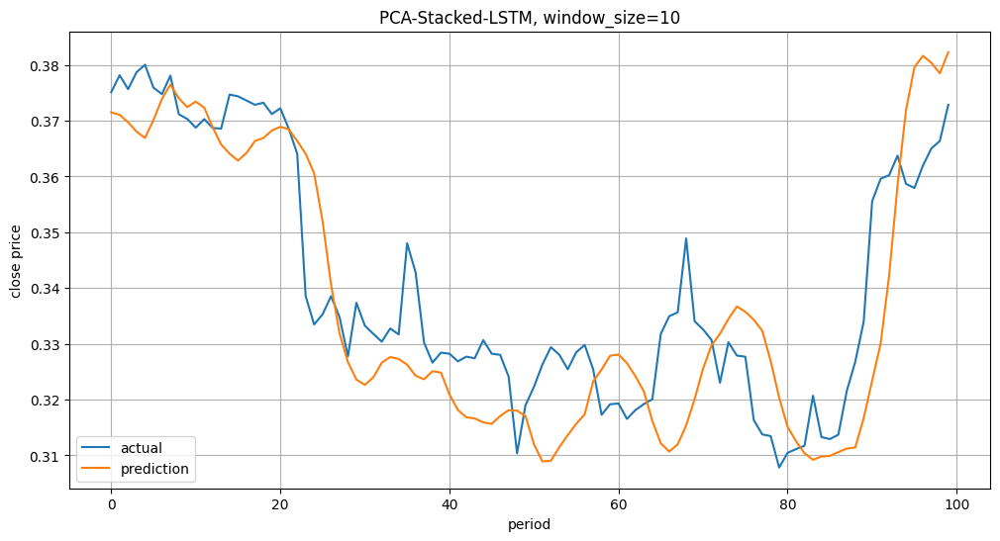

In [100]:
#stacked_pred = stacked_lstm_model.predict(X_p_test)
plt.figure(figsize=(12, 6))
plt.title('PCA-Stacked-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_p_test, label='actual')
plt.plot(stacked_pred, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()
#Graph with scaled X and y

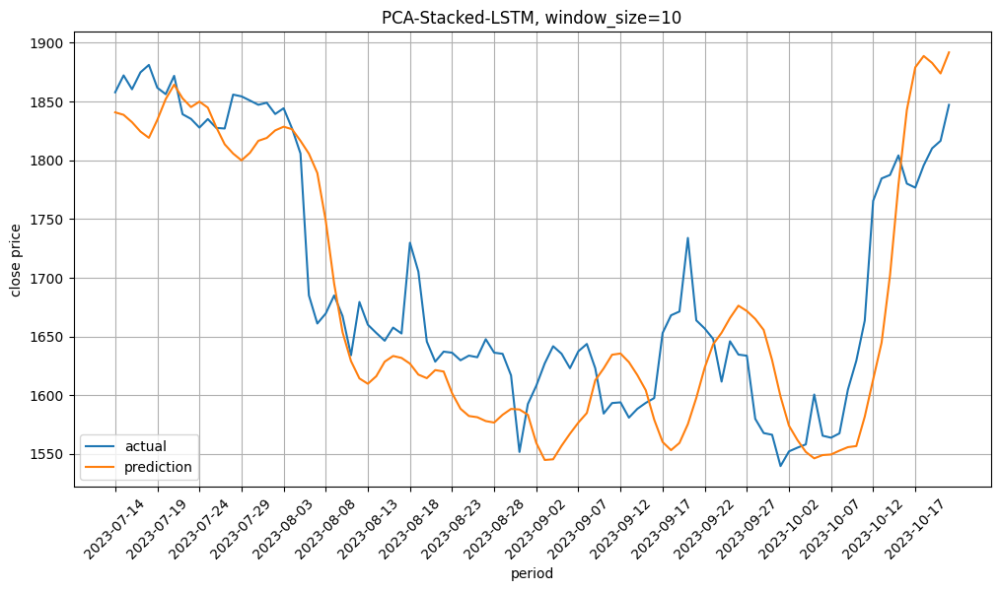

In [101]:
#Real values of prediction
plt.figure(figsize=(12, 6))
plt.title('PCA-Stacked-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(date_values_bi,y_pca_test_original, label='actual')
plt.plot(date_values_bi,y_pca_pred_original, label='prediction')
plt.grid()
plt.legend(loc='best')
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.show()

In [102]:
# Calculate error metrics
real_rmse_stacked = np.sqrt(mean_squared_error(y_pca_test_original, y_pca_pred_original))
real_mae_stacked = mean_absolute_error(y_pca_test_original, y_pca_pred_original)
real_mape_stacked = mean_absolute_percentage_error(y_pca_test_original, y_pca_pred_original)

# Print each value
print("RMSE of PCA-Stacked-LSTM :", real_rmse_stacked)
print("MAE of PCA-Stacked-LSTM :", real_mae_stacked)
print("MAPE of PCA-Stacked-LSTM :", real_mape_stacked)

RMSE of PCA-Stacked-LSTM : 58.91162169650828
MAE of PCA-Stacked-LSTM : 47.09552734375
MAPE of PCA-Stacked-LSTM : 0.02790890134280909


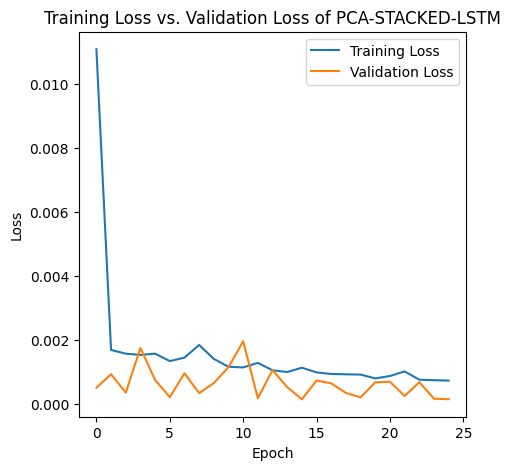

In [103]:
# Plot the training loss and validation loss over the epochs
plt.figure(figsize=(5, 5))
plt.plot(history_pb.history['loss'])
plt.plot(history_pb.history['val_loss'])
plt.title('Training Loss vs. Validation Loss of PCA-STACKED-LSTM')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training Loss', 'Validation Loss'], loc='upper right')
plt.show()

# SHAP of PCA LSTM

In [104]:
# Use the training data for deep explainer => can use fewer instances
explainer_stock_pca = shap.DeepExplainer(stacked_lstm_model, X_p_train)
shap_values_stock_pca = explainer_stock_pca.shap_values(X_p_test)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [105]:
# Use the training data for deep explainer => can use fewer instances
shap_values_stock_pca[0][0].shape

(10, 6)

In [106]:
shap_values_2D_pca = shap_values_stock_pca[0].reshape(-1,6)
X_p_test_2D = X_p_test.reshape(-1,6)

shap_values_2D_pca.shape, X_p_test_2D.shape

((1000, 6), (1000, 6))

In [107]:
features = ['Principal_Component_' + str(i) for i in range(1, X_p_test.shape[-1]+1)]
features

['Principal_Component_1',
 'Principal_Component_2',
 'Principal_Component_3',
 'Principal_Component_4',
 'Principal_Component_5',
 'Principal_Component_6']

In [108]:
X_p_test_2D = pd.DataFrame(data=X_p_test_2D, columns = features)

In [109]:
X_p_test_2D

,Principal_Component_1,Principal_Component_2,Principal_Component_3,Principal_Component_4,Principal_Component_5,Principal_Component_6
0,0.735307,0.870293,0.594719,0.290332,0.475632,0.418285
1,0.733149,0.868183,0.607731,0.287165,0.476143,0.434703
2,0.733077,0.875061,0.600491,0.293773,0.471325,0.415989
3,0.733143,0.873174,0.612763,0.299108,0.474596,0.391153
4,0.739012,0.875556,0.636572,0.323364,0.485856,0.392164
...,...,...,...,...,...,...
995,0.654999,0.802176,0.413701,0.267783,0.581174,0.533248
996,0.650872,0.809508,0.395412,0.253447,0.570518,0.538893
997,0.651540,0.808142,0.392138,0.250372,0.571459,0.537690
998,0.652805,0.805336,0.391955,0.244473,0.573087,0.539356


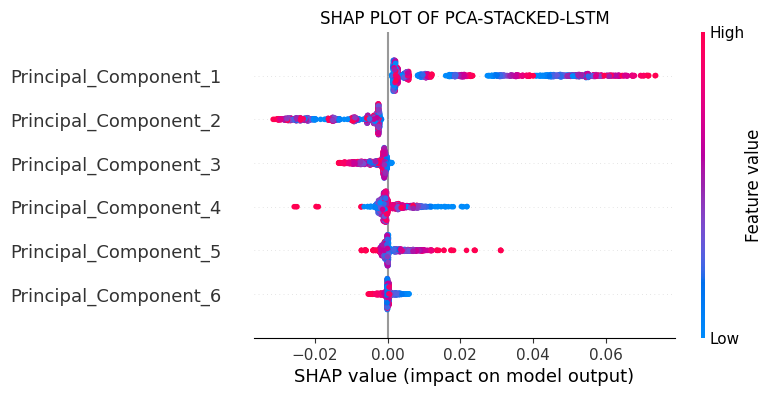

In [110]:
shap.summary_plot(shap_values_2D_pca, X_p_test_2D, show = False)
plt.title("SHAP PLOT OF PCA-STACKED-LSTM", loc='center')
plt.show()

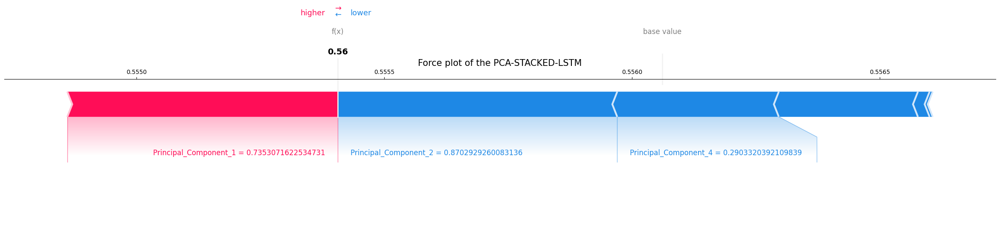

In [111]:
#Force_plot of the PCA-LSTM
expected_value_stock_pca = explainer_stock_pca.expected_value[0]

instance_index = 0
shap.force_plot(expected_value_stock_pca, shap_values_2D_pca[instance_index], X_p_test_2D.iloc[instance_index],
                link='logit', matplotlib=True,show = False,figsize=(30,5))

plt.title("Force plot of the PCA-STACKED-LSTM",fontsize=15)
plt.show()


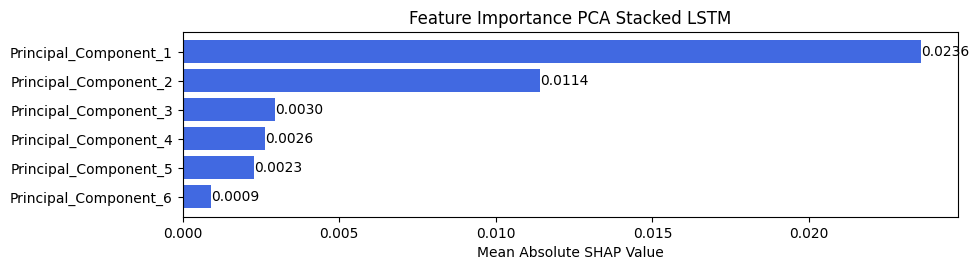

In [112]:
# Compute the mean absolute SHAP values for each feature
mean_shap_values_pc = np.abs(shap_values_2D_pca).mean(axis=0)

# Sorting the features based on their mean absolute SHAP values
sorted_indices_pc = np.argsort(mean_shap_values_pc)[::-1]
sorted_features_pc = X_p_test_2D.columns[sorted_indices_pc]
sorted_shap_values_pc = mean_shap_values_pc[sorted_indices_pc]

# Create the bar plot
plt.figure(figsize=(10, len(sorted_features_pc) * 0.4))
plt.barh(sorted_features_pc, sorted_shap_values_pc, color='royalblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance PCA Stacked LSTM')

# Annotate each bar with its exact value
for index, value in enumerate(sorted_shap_values_pc):
    plt.text(value, index, f'{value:.4f}', va='center')

plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

# Regular Stacked LSTM Model

In [113]:
def build_stacked_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=input_shape))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [114]:
input_shape = (X_train.shape[1], X_train.shape[2])  # Assuming X_p_train has the correct shape
normal_stacked_lstm_model = build_stacked_lstm_model(input_shape)

early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min')
# Train the model
history_RS = normal_stacked_lstm_model.fit(X_train, y_train, epochs=50, batch_size=32,
                    validation_data=(X_test, y_test), callbacks=[early_stopping])
#RS=Regular Stacked

Train on 2053 samples, validate on 100 samples
Epoch 1/50
2048/2053 [============================>.] - ETA: 0s - loss: 0.0151

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


2053/2053 [==============================] - 2s 1ms/sample - loss: 0.0150 - val_loss: 6.1372e-04
Epoch 2/50
2053/2053 [==============================] - 1s 578us/sample - loss: 0.0016 - val_loss: 8.9220e-04
Epoch 3/50
2053/2053 [==============================] - 1s 587us/sample - loss: 0.0012 - val_loss: 2.6285e-04
Epoch 4/50
2053/2053 [==============================] - 1s 589us/sample - loss: 0.0014 - val_loss: 6.8295e-04
Epoch 5/50
2053/2053 [==============================] - 1s 589us/sample - loss: 0.0013 - val_loss: 9.5077e-04
Epoch 6/50
2053/2053 [==============================] - 2s 744us/sample - loss: 0.0012 - val_loss: 7.0666e-04
Epoch 7/50
2053/2053 [==============================] - 2s 963us/sample - loss: 0.0010 - val_loss: 7.8013e-04
Epoch 8/50
2053/2053 [==============================] - 1s 574us/sample - loss: 9.5983e-04 - val_loss: 6.0567e-04
Epoch 9/50
2053/2053 [==============================] - 1s 578us/sample - loss: 9.2264e-04 - val_loss: 3.1773e-04
Epoch 10/50
205

In [115]:
normal_stacked_lstm_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 10, 128)           92160     
                                                                 
 lstm_5 (LSTM)               (None, 64)                49408     
                                                                 
 dense_6 (Dense)             (None, 25)                1625      
                                                                 
 dense_7 (Dense)             (None, 1)                 26        
                                                                 
Total params: 143219 (559.45 KB)
Trainable params: 143219 (559.45 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [116]:
normal_stacked_pred = normal_stacked_lstm_model.predict(X_test)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


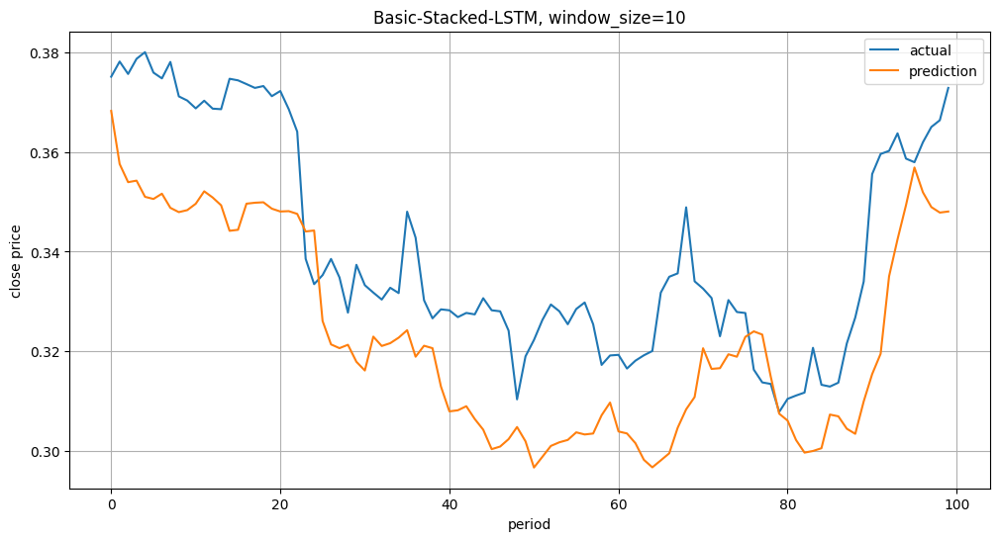

In [117]:
#stacked_pred = stacked_lstm_model.predict(X_p_test)
plt.figure(figsize=(12, 6))
plt.title('Basic-Stacked-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_test, label='actual')
plt.plot(normal_stacked_pred, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()

In [118]:
y_nstacked_pred_original = y_scaler.inverse_transform(normal_stacked_pred)
y_nstacked_test_original = y_scaler.inverse_transform(y_test)

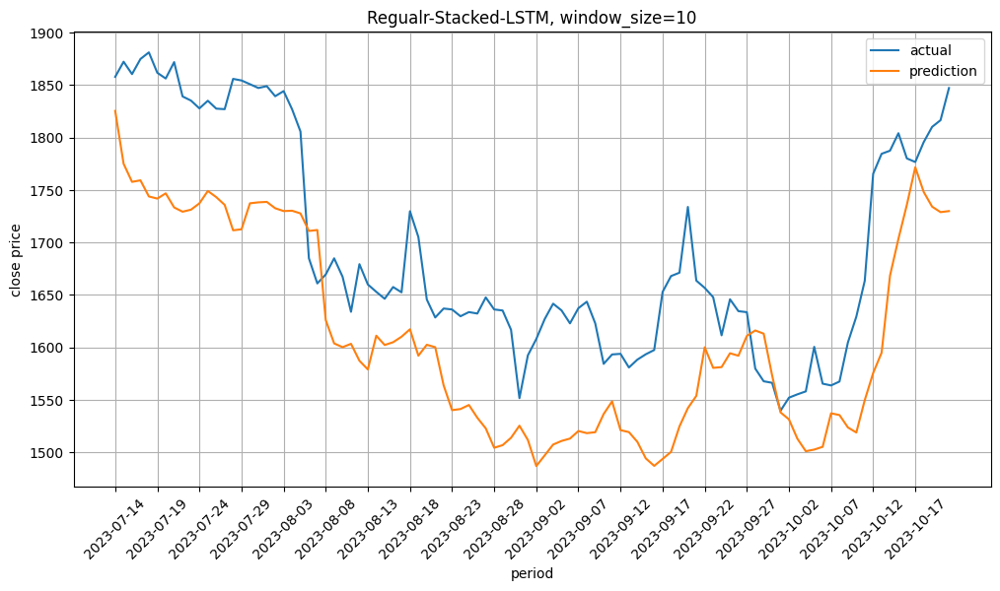

In [119]:
#Real values of prediction
plt.figure(figsize=(12, 6))
plt.title('Regualr-Stacked-LSTM, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(date_values_bi,y_nstacked_test_original, label='actual')
plt.plot(date_values_bi,y_nstacked_pred_original, label='prediction')
plt.grid()
plt.legend(loc='best')
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.show()

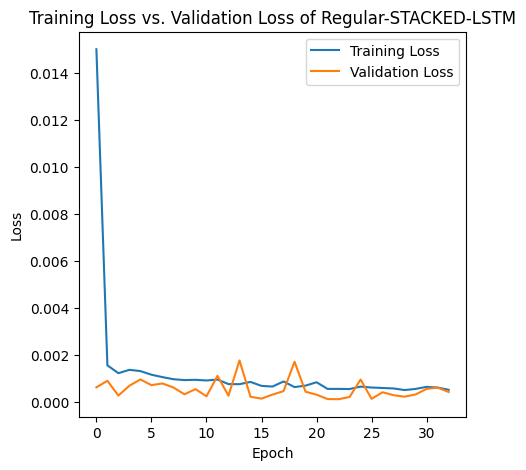

In [120]:
# Plot the training loss and validation loss over the epochs
plt.figure(figsize=(5, 5))
plt.plot(history_RS.history['loss'])
plt.plot(history_RS.history['val_loss'])
plt.title('Training Loss vs. Validation Loss of Regular-STACKED-LSTM')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training Loss', 'Validation Loss'], loc='upper right')
plt.show()

In [121]:
# Calculate error metrics
real_rmse_rstacked = np.sqrt(mean_squared_error(y_nstacked_test_original, y_nstacked_pred_original))
real_mae_rstacked = mean_absolute_error(y_nstacked_test_original, y_nstacked_pred_original)
real_mape_rstacked = mean_absolute_percentage_error(y_nstacked_test_original, y_nstacked_pred_original)

# Print each value
print("RMSE of Regular-Stacked-LSTM :", real_rmse_rstacked)
print("MAE of Regular-Stacked-LSTM :", real_mae_rstacked)
print("MAPE of Regular-Stacked-LSTM :", real_mape_rstacked)

RMSE of Regular-Stacked-LSTM : 96.1852745592019
MAE of Regular-Stacked-LSTM : 86.56121215820312
MAPE of Regular-Stacked-LSTM : 0.05064207915745829


# SHAP of Regular Stacked LSTM

In [122]:
# Use the training data for deep explainer
explainer_stock_RS = shap.DeepExplainer(normal_stacked_lstm_model, X_train)
shap_values_stock_RS = explainer_stock_RS.shap_values(X_test)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [123]:
shap_values_stock_RS[0][0].shape

(10, 51)

In [124]:
shap_values_RS_2D = shap_values_stock_RS[0].reshape(-1,51)
X_test_RS_2D = X_test.reshape(-1,51)

shap_values_RS_2D.shape, X_test_RS_2D.shape

((1000, 51), (1000, 51))

In [125]:
X_test_RS_2D = pd.DataFrame(data=X_test_RS_2D, columns = actual_column_names)

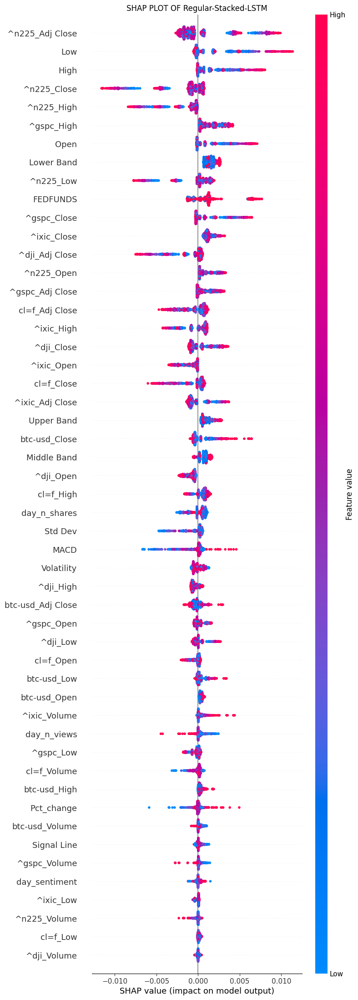

In [126]:
shap.summary_plot(shap_values_RS_2D, X_test_RS_2D, max_display=max_display_features, show = False)
plt.title("SHAP PLOT OF Regular-Stacked-LSTM", loc='center')
plt.show()

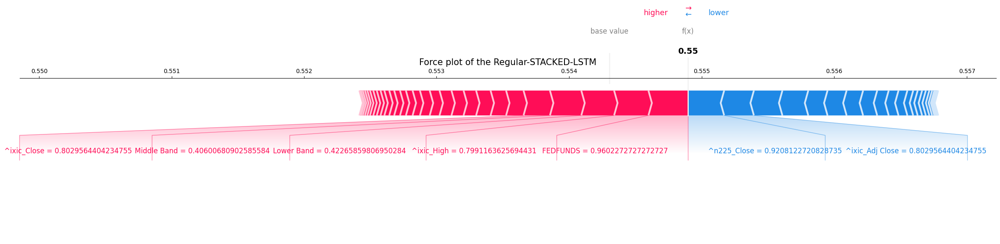

In [127]:
#Force_plot of the PCA-LSTM
expected_value_stock_RS = explainer_stock_RS.expected_value[0]

instance_index = 0
shap.force_plot(expected_value_stock_RS, shap_values_RS_2D[instance_index], X_test_RS_2D.iloc[instance_index],
                link='logit', matplotlib=True,show = False,figsize=(30,5))

plt.title("Force plot of the Regular-STACKED-LSTM",fontsize=15)
plt.show()

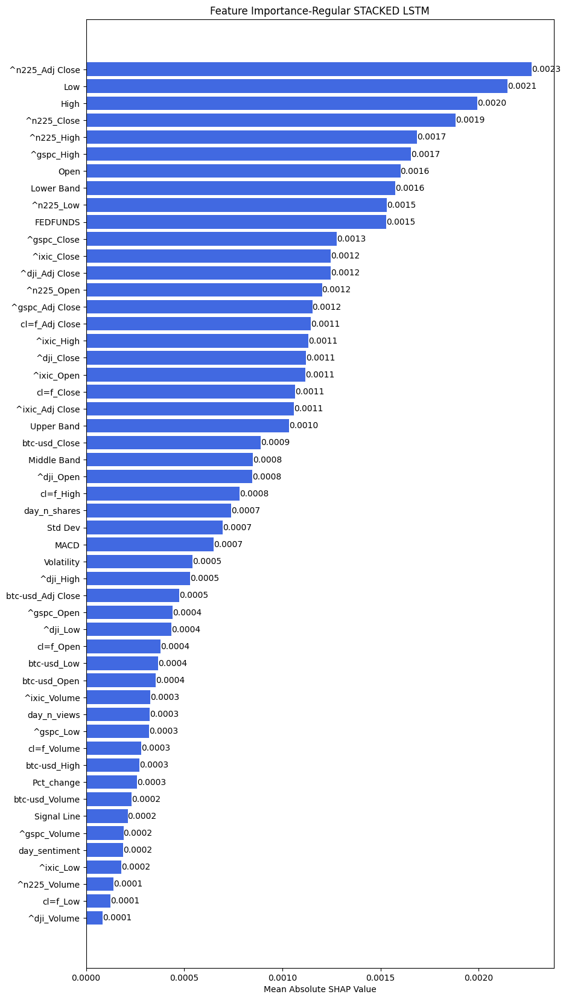

In [128]:
# Compute the mean absolute SHAP values for each feature
mean_shap_values_rs = np.abs(shap_values_RS_2D).mean(axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices_rs = np.argsort(mean_shap_values_rs)[::-1]
sorted_features_rs = X_test_RS_2D.columns[sorted_indices_rs]
sorted_shap_values_rs = mean_shap_values_rs[sorted_indices_rs]

# Create the bar plot
plt.figure(figsize=(10, len(sorted_features_rs) * 0.4))
plt.barh(sorted_features_rs, sorted_shap_values_rs, color='royalblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance-Regular STACKED LSTM')

# Annotate each bar with its exact value
for index, value in enumerate(sorted_shap_values_rs):
    plt.text(value, index, f'{value:.4f}', va='center')

plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

# Normal GRU Model

In [129]:
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers.schedules import ExponentialDecay

lr_schedule = ExponentialDecay(
    initial_learning_rate=0.1,
    decay_steps=10000,
    decay_rate=0.96,
    staircase=True)


# Importing libraries
from keras.models import Sequential
from keras.layers import Dense, GRU
from keras.optimizers import Adam
from keras.layers import Dropout

# The GRU architecture
GRU_model = Sequential()

# First GRU layer with Dropout regularisation
GRU_model.add(GRU(units=64, return_sequences=True, input_shape=(X_train.shape[1], 51), activation='tanh'))
GRU_model.add(Dropout(0.3))

# Second GRU layer
GRU_model.add(GRU(units=64, return_sequences=True, activation='tanh'))
GRU_model.add(Dropout(0.3))

# Third GRU layer
GRU_model.add(GRU(units=64, return_sequences=True, activation='tanh'))
GRU_model.add(Dropout(0.3))

# Fourth GRU layer
GRU_model.add(GRU(units=64, activation='tanh'))
GRU_model.add(Dropout(0.3))

# The output layer
GRU_model.add(Dense(units=1))

# Compiling the RNN
#GRU_model.compile(optimizer=SGD(learning_rate=0.001, decay=1e-7, momentum=0.9, nesterov=False), loss='mean_squared_error')
GRU_model.compile(optimizer=SGD(learning_rate=lr_schedule, momentum=0.9, nesterov=False), loss='mean_squared_error')

from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min')

# Fitting to the training set
gru_history = GRU_model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1,
                    validation_data=(X_test, y_test), callbacks=[early_stopping])

Train on 2053 samples, validate on 100 samples
Epoch 1/50
2048/2053 [============================>.] - ETA: 0s - loss: 0.0445

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


2053/2053 [==============================] - 3s 1ms/sample - loss: 0.0445 - val_loss: 0.0022
Epoch 2/50
2053/2053 [==============================] - 2s 882us/sample - loss: 0.0050 - val_loss: 4.9676e-04
Epoch 3/50
2053/2053 [==============================] - 2s 836us/sample - loss: 0.0038 - val_loss: 7.3362e-04
Epoch 4/50
2053/2053 [==============================] - 1s 669us/sample - loss: 0.0034 - val_loss: 2.5968e-04
Epoch 5/50
2053/2053 [==============================] - 1s 668us/sample - loss: 0.0031 - val_loss: 4.7413e-04
Epoch 6/50
2053/2053 [==============================] - 1s 646us/sample - loss: 0.0034 - val_loss: 0.0027
Epoch 7/50
2053/2053 [==============================] - 1s 663us/sample - loss: 0.0031 - val_loss: 2.5294e-04
Epoch 8/50
2053/2053 [==============================] - 1s 645us/sample - loss: 0.0029 - val_loss: 3.9547e-04
Epoch 9/50
2053/2053 [==============================] - 1s 632us/sample - loss: 0.0029 - val_loss: 4.5428e-04
Epoch 10/50
2053/2053 [========

In [130]:
GRU_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 10, 64)            22464     
                                                                 
 dropout (Dropout)           (None, 10, 64)            0         
                                                                 
 gru_1 (GRU)                 (None, 10, 64)            24960     
                                                                 
 dropout_1 (Dropout)         (None, 10, 64)            0         
                                                                 
 gru_2 (GRU)                 (None, 10, 64)            24960     
                                                                 
 dropout_2 (Dropout)         (None, 10, 64)            0         
                                                                 
 gru_3 (GRU)                 (None, 64)               

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


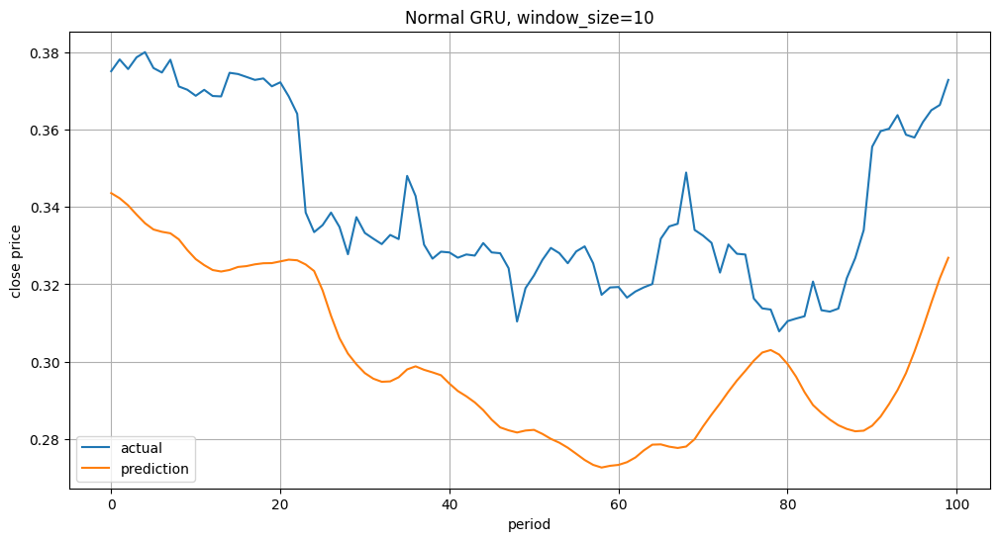

In [131]:
gru_pred = GRU_model.predict(X_test)
plt.figure(figsize=(12, 6))
plt.title('Normal GRU, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_test, label='actual')
plt.plot(gru_pred, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()


In [132]:
y_pred_gru_original = y_scaler.inverse_transform(gru_pred)
y_test_gru_original = y_scaler.inverse_transform(y_test)

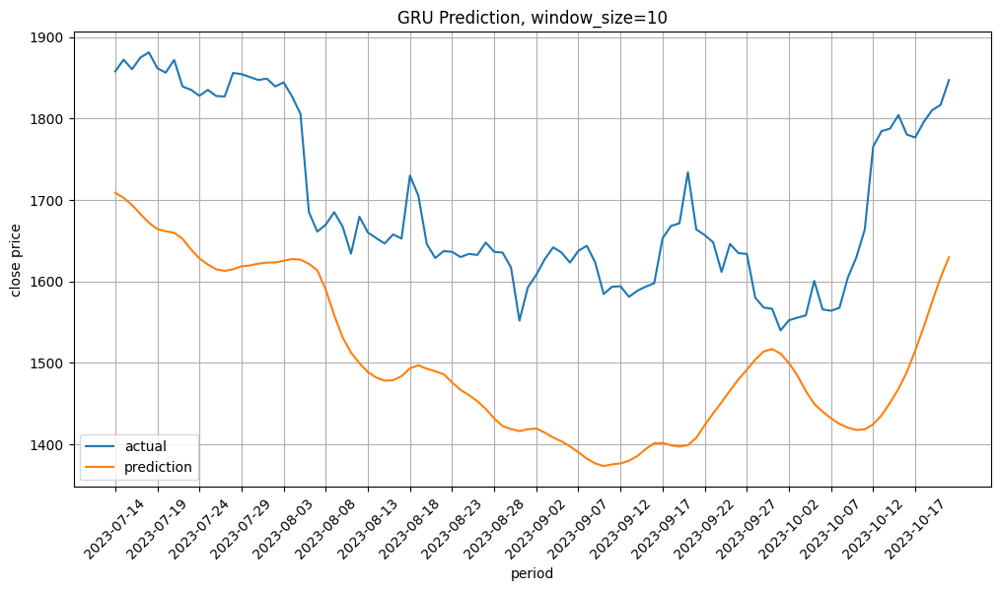

In [133]:
plt.figure(figsize=(12, 6))
plt.title('GRU Prediction, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(date_values_bi,y_test_gru_original, label='actual')
plt.plot(date_values_bi,y_pred_gru_original, label='prediction')
plt.grid()
plt.legend(loc='best')
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.show()

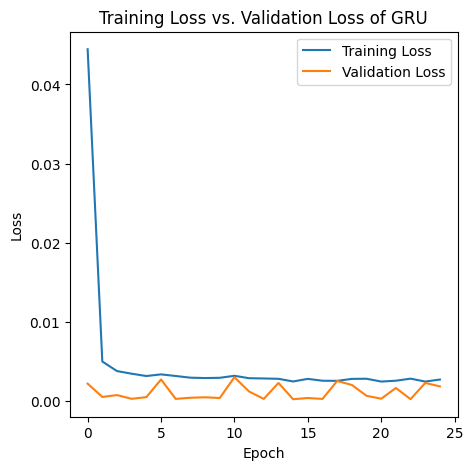

In [134]:
# Plot the training loss and validation loss over the epochs
plt.figure(figsize=(5, 5))
plt.plot(gru_history.history['loss'])
plt.plot(gru_history.history['val_loss'])
plt.title('Training Loss vs. Validation Loss of GRU')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training Loss', 'Validation Loss'], loc='upper right')
plt.show()

In [135]:
# Calculate metrics with the real number value
real_rmse_gru = np.sqrt(mean_squared_error(y_test_gru_original, y_pred_gru_original))
real_mae_gru = mean_absolute_error(y_test_gru_original, y_pred_gru_original)
real_mape_gru = mean_absolute_percentage_error(y_test_gru_original, y_pred_gru_original)
#Print each value
print("RMSE of GRU:", real_rmse_gru)
print("MAE of GRU:",real_mae_gru)
print("MAPE of GRU:", real_mape_gru)

RMSE of GRU: 202.4619316653404
MAE of GRU: 192.09942626953125
MAPE of GRU: 0.11273268816563768


# SHAP GRU

In [136]:
# Use the training data for deep explainer
explainer_stock_gru = shap.DeepExplainer(GRU_model, X_train)
shap_values_stock_gru = explainer_stock_gru.shap_values(X_test)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [137]:
shap_values_stock_gru[0][0].shape

(10, 51)

In [138]:
shap_values_stock_gru_2D = shap_values_stock_gru[0].reshape(-1,51)
X_test_gru_2D = X_test.reshape(-1,51)

shap_values_stock_gru_2D.shape, X_test_gru_2D.shape

((1000, 51), (1000, 51))

In [139]:
X_test_gru_2D = pd.DataFrame(data=X_test_gru_2D, columns = actual_column_names)

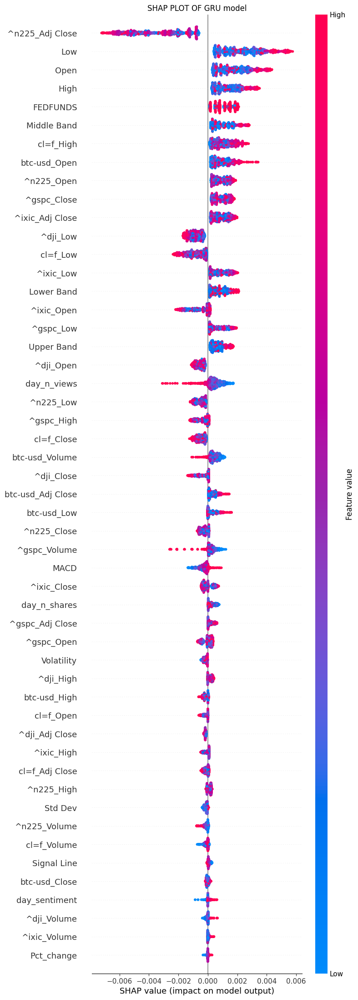

In [140]:
shap.summary_plot(shap_values_stock_gru_2D, X_test_gru_2D, max_display=max_display_features, show = False)
plt.title("SHAP PLOT OF GRU model", loc='center')
plt.show()

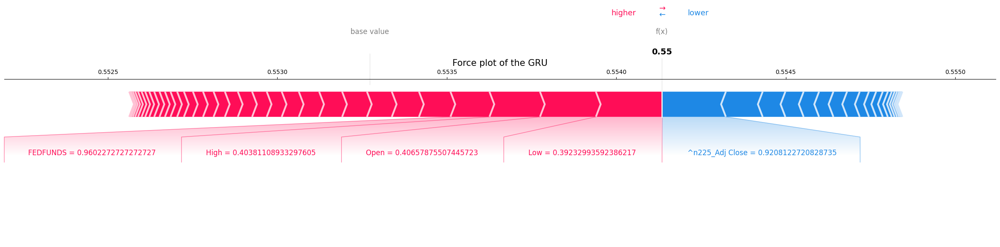

In [141]:
#Force_plot of the GRU
expected_value_stock_GRU = explainer_stock_gru.expected_value[0]

instance_index = 0
shap.force_plot(expected_value_stock_GRU, shap_values_stock_gru_2D[instance_index], X_test_gru_2D.iloc[instance_index],
                link='logit', matplotlib=True,show = False,figsize=(30,5))

plt.title("Force plot of the GRU",fontsize=15)
plt.show()

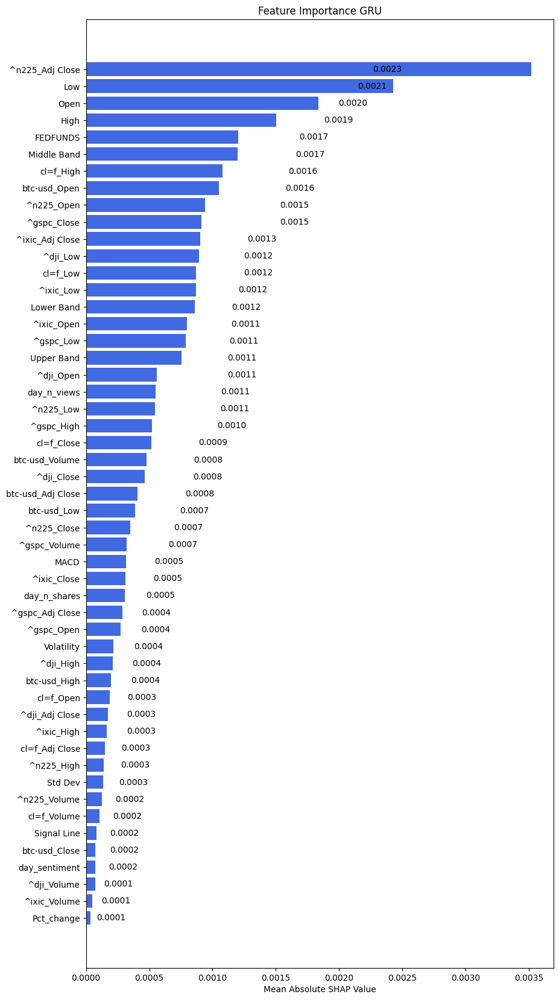

In [142]:
# Compute the mean absolute SHAP values for each feature
mean_shap_values_gru = np.abs(shap_values_stock_gru_2D).mean(axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices_gru = np.argsort(mean_shap_values_gru)[::-1]
sorted_features_gru = X_test_gru_2D.columns[sorted_indices_gru]
sorted_shap_values_gru = mean_shap_values_gru[sorted_indices_gru]

# Create the bar plot
plt.figure(figsize=(10, len(sorted_features_gru) * 0.4))
plt.barh(sorted_features_gru, sorted_shap_values_gru, color='royalblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance GRU')

# Annotate each bar with its exact value
for index, value in enumerate(sorted_shap_values_rs):
    plt.text(value, index, f'{value:.4f}', va='center')

plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

# Machine Learning model, Voting Regressor with TPOT

In [143]:
import pandas as pd
from sklearn.metrics import precision_score,accuracy_score
import matplotlib.pyplot as plt
import pandas_datareader as web
import datetime as dt
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import yfinance as yf
import numpy as np
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingRegressor,VotingRegressor,RandomForestRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ExpSineSquared, Sum,Product,Matern
from xgboost import XGBRegressor
import shap
from sklearn.model_selection import TimeSeriesSplit
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [144]:
import pandas as pd

# Assuming 'data01.csv' contains your data
dfm = pd.read_csv("data01.csv")

# Define a dictionary with the new column names
new_column_names = {
    'date': 'Date',
    'eth-usd_Open': 'Open',
    'eth-usd_High': 'High',
    'eth-usd_Low': 'Low',
    'eth-usd_Close': 'Close',
    'eth-usd_Adj Close': 'Adj Close',
    'eth-usd_Volume': 'Volume'
}
# Rename the columns using the dictionary
dfm.rename(columns=new_column_names, inplace=True)

# Set 'date' as the index
dfm.set_index('Date', inplace=True)

# Now, your DataFrame has the updated column names and 'date' as the index
dfm.head()



,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,^n225_Open,^n225_High,^n225_Low,^n225_Close,^n225_Adj Close,^n225_Volume,day_sentiment,day_n_views,day_n_shares,FEDFUNDS
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,22989.439453,23382.150391,22522.830078,22868.710938,22868.710938,160400000.0,-0.216567,93713.0,933.0,1.16
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.102967,346006.0,3920.0,1.16
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,22607.560547,22607.919922,22380.990234,22380.990234,22380.990234,80700000.0,-0.572450,74503.0,1089.0,1.16


In [145]:
dfm_reset = dfm.reset_index()

In [146]:
# Making the percentage changes in each day
dfm['Pct_change'] = dfm['Close'].pct_change()
dfm['Pct_change'] = np.log1p(dfm['Pct_change'])

# Choose the desired time periods for the moving averages
short_period = 12  # Short-term EMA period
long_period = 26  # Long-term EMA period
signal_period = 9  # Signal line EMA period

# Calculate the short-term EMA
dfm['Short EMA'] = dfm['Close'].ewm(span=short_period, adjust=False).mean()

# Calculate the long-term EMA
dfm['Long EMA'] = dfm['Close'].ewm(span=long_period, adjust=False).mean()

# Calculate the MACD line
dfm['MACD'] = dfm['Short EMA'] - dfm['Long EMA']

# Calculate the signal line
dfm['Signal Line'] = dfm['MACD'].ewm(span=signal_period, adjust=False).mean()

# Calculate the MACD histogram
dfm['MACD Histogram'] = dfm['MACD'] - dfm['Signal Line']

# Calculate the logarithmic returns
dfm['Log Returns'] = np.log(dfm['Close'] / dfm['Close'].shift(1))

# Calculate the volatility
dfm['Volatility'] = dfm['Log Returns'].rolling(window=20).std() * np.sqrt(252)

# desired tDme period for the moving average and standard deviation
window = 20  # Number of Trading days in a month
num_std = 2
# 2 standard deviations above and below the middle band provides
# a range that encompasses a large portion of typical price movements

# Calculate the middle band (simple moving average)
dfm['Middle Band'] = dfm['Close'].rolling(window=window).mean()

# Calculate the standard deviation of the closing prices
dfm['Std Dev'] = dfm['Close'].rolling(window=window).std()

# Calculate the upper band and lower band
dfm['Upper Band'] = dfm['Middle Band'] + (num_std * dfm['Std Dev'])
dfm['Lower Band'] = dfm['Middle Band'] - (num_std * dfm['Std Dev'])

# Making Next day's close price column in each date.
dfm['Next_day'] = dfm['Close'].shift(-1)


In [147]:
dfm

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,299.252991
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,-1.725551,-0.345110,-1.380441,-0.069790,NaN,NaN,NaN,NaN,NaN,314.681000
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,-1.827089,-0.641506,-1.185583,0.050270,NaN,NaN,NaN,NaN,NaN,307.907990
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,-2.426118,-0.998428,-1.427690,-0.021758,NaN,NaN,NaN,NaN,NaN,316.716003
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,-2.165161,-1.231775,-0.933386,0.028204,NaN,NaN,NaN,NaN,NaN,337.631012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,34089.574219,...,45.485737,22.846100,22.639636,-0.001927,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,34538.480469,...,48.428640,27.962608,20.466032,0.010598,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623
2023-10-30,1795.589111,1829.249512,1779.364502,1810.088623,1810.088623,7.534051e+09,34531.742188,34843.933594,34110.972656,34502.363281,...,51.342534,32.638593,18.703940,0.008067,0.279047,1663.471027,108.299164,1880.069355,1446.872698,1816.458984


In [148]:
dfm.isnull().sum()

Open                  0
High                  0
Low                   0
Close                 0
Adj Close             0
Volume                0
btc-usd_Open          0
btc-usd_High          0
btc-usd_Low           0
btc-usd_Close         0
btc-usd_Adj Close     0
btc-usd_Volume        0
cl=f_Open             0
cl=f_High             0
cl=f_Low              0
cl=f_Close            0
cl=f_Adj Close        0
cl=f_Volume           0
^dji_Open             0
^dji_High             0
^dji_Low              0
^dji_Close            0
^dji_Adj Close        0
^dji_Volume           0
^gspc_Open            0
^gspc_High            0
^gspc_Low             0
^gspc_Close           0
^gspc_Adj Close       0
^gspc_Volume          0
^ixic_Open            0
^ixic_High            0
^ixic_Low             0
^ixic_Close           0
^ixic_Adj Close       0
^ixic_Volume          0
^n225_Open            0
^n225_High            0
^n225_Low             0
^n225_Close           0
^n225_Adj Close       0
^n225_Volume    

In [149]:
dfm = dfm.dropna()

# Drop unimportant features for VR

In [150]:
dfm = dfm.drop(["Adj Close","Volume","Close",'Short EMA','Log Returns', 'Long EMA', 'MACD Histogram'],axis = 1)

In [151]:
features_v = dfm.columns[:-1]
#features_v = dfm.columns

In [152]:
scaler = MinMaxScaler()

scale_cols = ['Open', 'High', 'Low', 'Pct_change', 'MACD','Signal Line','Volatility','Middle Band', 'Std Dev',
       'Upper Band', 'Lower Band']

scaled_df_v = scaler.fit_transform(dfm[scale_cols])

scaled_df_v = pd.DataFrame(scaled_df_v, columns=scale_cols)

print(scaled_df_v)

          Open      High       Low  Pct_change      MACD  Signal Line  \
0     0.082315  0.090914  0.073835    0.572715  0.463765     0.465773   
1     0.073413  0.079094  0.068694    0.758190  0.462639     0.468150   
2     0.076374  0.080574  0.074534    0.755293  0.463217     0.470183   
3     0.080954  0.081329  0.080649    0.692684  0.462815     0.471717   
4     0.080288  0.082697  0.079613    0.707734  0.462212     0.472807   
...        ...       ...       ...         ...       ...          ...   
2158  0.363858  0.357608  0.359986    0.684101  0.471231     0.449548   
2159  0.358840  0.356873  0.364731    0.698694  0.474432     0.457866   
2160  0.358095  0.358930  0.363139    0.714639  0.478214     0.465386   
2161  0.362121  0.362833  0.366010    0.711417  0.481959     0.472258   
2162  0.365198  0.360903  0.367133    0.705620  0.484795     0.478405   

      Volatility  Middle Band   Std Dev  Upper Band  Lower Band  
0       0.324340     0.063604  0.091845    0.080644    0.

In [153]:
# PCA
n_components_v = 11
pca_v = PCA(n_components=n_components_v)
X_pca_v = pca_v.fit_transform(scaled_df_v)

In [154]:
X_pca_df_v = pd.DataFrame(X_pca_v)
X_pca_df_v

,0,1,2,3,4,5,6,7,8,9,10
0,-0.421320,0.032766,0.100168,-0.001470,0.128499,-0.028947,0.002126,0.011248,-0.002656,8.475072e-15,5.010659e-18
1,-0.429645,0.012139,0.092159,0.024617,-0.051930,0.006496,0.005620,-0.001937,0.002681,-5.533142e-17,2.732847e-17
2,-0.423463,0.009448,0.092939,0.024028,-0.049287,0.004947,0.002297,-0.002521,0.001316,7.616633e-17,-3.585223e-16
3,-0.417166,0.005056,0.090256,0.017812,0.012224,-0.004184,-0.003690,-0.000558,-0.000225,-3.202109e-17,-7.143660e-17
4,-0.415797,0.003810,0.089753,0.015623,-0.002588,0.000155,-0.001725,-0.000394,-0.000396,7.910793e-16,1.608030e-16
...,...,...,...,...,...,...,...,...,...,...,...
2158,0.260966,-0.169170,-0.040070,0.044603,0.019024,-0.034124,-0.000959,-0.003776,0.003384,-5.257927e-18,2.142064e-17
2159,0.264353,-0.169117,-0.031044,0.051954,0.005282,-0.027611,-0.006655,-0.000876,0.002685,-4.003151e-17,1.084088e-18
2160,0.269100,-0.180257,-0.028273,0.066104,-0.008549,-0.019793,-0.004330,-0.000418,0.002676,-3.225621e-17,-8.380399e-19
2161,0.278093,-0.183157,-0.021459,0.070460,-0.004639,-0.018791,-0.004148,-0.000826,0.001231,-7.458690e-18,-4.143155e-17


## Split into X and y for ML Model

In [155]:
X_v = X_pca_v
# For the target variable, assume you still want to predict 'Next_day'
y_v = dfm['Next_day'].values

# Convert to numpy arrays
X_v = np.array(X_v)
y_v = np.array(y_v)

X_v.shape, y_v.shape

((2163, 11), (2163,))

In [156]:
# Access the principal components
principal_components = pca_v.components_

# Access the explained variance of each principal component
explained_variances = pca_v.explained_variance_ratio_

# Print the explained variance of each principal component
for i, explained_variance in enumerate(explained_variances):
    print(f"Principal Component {i+1}: {explained_variance:.4f}")

# Print the loadings of the original features on each principal component
features_v = scaled_df_v.columns  # Assuming features_v are the columns of scaled_df_v
for i, pc in enumerate(principal_components):
    print(f"Principal Component {i+1} Loadings:")
    for feature, loading in zip(features_v, pc):
        print(f"{feature}: {loading:.4f}")

Principal Component 1: 0.8574
Principal Component 2: 0.0596
Principal Component 3: 0.0557
Principal Component 4: 0.0143
Principal Component 5: 0.0089
Principal Component 6: 0.0037
Principal Component 7: 0.0002
Principal Component 8: 0.0001
Principal Component 9: 0.0000
Principal Component 10: 0.0000
Principal Component 11: 0.0000
Principal Component 1 Loadings:
Open: 0.3903
High: 0.3950
Low: 0.3839
Pct_change: -0.0017
MACD: 0.0237
Signal Line: 0.0313
Volatility: -0.0153
Middle Band: 0.4130
Std Dev: 0.1973
Upper Band: 0.4343
Lower Band: 0.3799
Principal Component 2 Loadings:
Open: -0.0688
High: -0.0571
Low: -0.0906
Pct_change: -0.0153
MACD: -0.3301
Signal Line: -0.3238
Volatility: 0.7487
Middle Band: 0.0260
Std Dev: 0.4208
Upper Band: 0.1405
Lower Band: -0.1084
Principal Component 3 Loadings:
Open: 0.0390
High: 0.0560
Low: 0.0235
Pct_change: 0.0160
MACD: 0.5834
Signal Line: 0.6344
Volatility: 0.3948
Middle Band: -0.0975
Std Dev: 0.2312
Upper Band: -0.0255
Lower Band: -0.1796
Principal C

In [157]:
# Scale the input sequences (X)
scaler = MinMaxScaler()
X_v = scaler.fit_transform(X_v.reshape(X_v.shape[0], -1))

# Scale the target variable (y)
y_scaler = MinMaxScaler()
y_v = y_scaler.fit_transform(y_v.reshape(-1, 1))


In [158]:
y_v

array([[0.07673914],
       [0.08084805],
       [0.08019425],
       ...,
       [0.36502981],
       [0.36637725],
       [0.37285613]])

In [159]:
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=100)
for train_index, test_index in tscv.split(X, y):
    X_vtrain, X_vtest = X_v[train_index], X_v[test_index]
    y_vtrain, y_vtest = y_v[train_index], y_v[test_index]

In [160]:
print(X_vtrain.shape, X_vtest.shape,y_vtrain.shape, y_vtest.shape)

(2053, 11) (100, 11) (2053, 1) (100, 1)


In [161]:
y_train

array([[0.07559844],
       [0.09112687],
       [0.11995542],
       ...,
       [0.3766259 ],
       [0.38176135],
       [0.37347214]])

In [162]:
X_vtrain_2d = X_train.reshape((X_train.shape[0], -1))
X_vtest_2d = X_test.reshape((X_test.shape[0], -1))
# Fit the PCA on your training data and apply the dimensionality reduction
X_vtrain_pca = pca_v.fit_transform(X_vtrain_2d)

# Apply the same transformation to your test data
X_vtest_pca = pca_v.transform(X_vtest_2d)

# Voting Regressor Ensemble

In [163]:
!pip install tpot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.4/87.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11937 sha256=d21d57bcac37b4cf986a513531db3b95864c68de22cc7c8f4284729df20ec398
  Stored in directory: /root/.cache/pip/wheels/af/f9/87/bf5b3d565c2a007b4dae9d8142dccc85a9f164e517062dd519
Successfully built stopit


In [164]:
from tpot.config import regressor_config_dict
from tpot import TPOTRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
from sklearn.ensemble import VotingRegressor

In [165]:
cv_split = TimeSeriesSplit(n_splits=10, test_size=100)

models = [
     (GaussianProcessRegressor(), {
        "kernel": [DotProduct(),WhiteKernel()],
        "n_restarts_optimizer": [2,5],
        "alpha": [1e-10, 1e-5, 1e-1]
    })
]

vr_estimators = {}
for model, parameters in models:
    grid_search = GridSearchCV(estimator=model, cv=cv_split, param_grid=parameters)
    grid_search.fit(X_vtrain_pca, y_train)
    vr_estimators.update([(model.__class__.__name__, grid_search.best_estimator_)])

In [166]:
# Define the TPOT configurations for each model
tpot_config = {
    'xgboost.XGBRegressor': {
        "max_depth": [3, 10,20],
        "learning_rate": [0.01, 0.1],
        "n_estimators": [100, 300],
        "colsample_bytree": [0.5, 1]
    },
    'lightgbm.LGBMRegressor': {
        "max_depth": [3, 10,20],
        "num_leaves": [10,30,50],
        "learning_rate": [0.01, 0.1],
        "n_estimators": [100, 300],
        "colsample_bytree": [0.5, 1]
    },
    'sklearn.svm.SVR': {
        "epsilon": [0.1, 0.2, 0.5],
        "kernel": ['linear', 'poly', 'rbf'],
        "gamma": ['scale', 'auto']
    }

}

best_models = {}

# Loop through the model configurations and find the best model for each
for model_name, config in tpot_config.items():
    tpot = TPOTRegressor(generations=2, population_size=10, verbosity=2, config_dict={model_name: config})
    tpot.fit(X_vtrain_pca, y_train)

    # Get the best model from TPOT
    best_model = tpot.fitted_pipeline_

    # Store the best model in the dictionary
    best_models[model_name] = best_model

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -0.0242239385511303

Generation 2 - Current best internal CV score: -0.0242239385511303

Best pipeline: XGBRegressor(input_matrix, colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=300)
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 50, number of used features: 11
[LightGBM] [Info] Start training from score 0.197966
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

เอาต์พุตของการสตรีมมีการตัดเหลือเพียง 5000 บรรทัดสุดท้าย
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -0.015374566394588845

Generation 2 - Current best internal CV score: -0.015374566394588845

Best pipeline: SVR(CombineDFs(input_matrix, input_matrix), epsilon=0.1, gamma=scale, kernel=linear)


In [167]:
vr_estimators.update(best_models)

In [168]:
vr_estimators = [(model_name, model) for model_name, model in vr_estimators.items()]
vr = VotingRegressor(estimators=vr_estimators)
vr.fit(X_vtrain_pca, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2805
[LightGBM] [Info] Number of data points in the train set: 2053, number of used features: 11
[LightGBM] [Info] Start training from score 0.236483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

VotingRegressor(estimators=[('GaussianProcessRegressor',
                             GaussianProcessRegressor(kernel=DotProduct(sigma_0=1),
                                                      n_restarts_optimizer=5)),
                            ('xgboost.XGBRegressor',
                             Pipeline(steps=[('xgbregressor',
                                              XGBRegressor(base_score=None,
                                                           booster=None,
                                                           callbacks=None,
                                                           colsample_bylevel=None,
                                                           colsample_bynode=None,
                                                           colsample_bytree=1,
                                                           device=None,
                                                           early_stopping_rounds=None...
                                              LGBMRegressor(colsample_bytree=1,
                                                            max_depth=3,
                                                            n_estimators=300,
                                                            num_leaves=30))])),
                            ('sklearn.svm.SVR',
                             Pipeline(steps=[('featureunion',
                                              FeatureUnion(transformer_list=[('functiontransformer-1',
                                                                              FunctionTransformer(func=<function copy at 0x7a8ae1db5a20>)),
                                                                             ('functiontransformer-2',
                                                                              FunctionTransformer(func=<function copy at 0x7a8ae1db5a20>))])),
                                             ('svr', SVR(kernel='linear'))]))])

In [169]:
y_pred_reg = vr.predict(X_vtest_pca)

In [170]:
y_pred_inv = y_scaler.inverse_transform(y_pred_reg.reshape(-1,1))
#y_test_originalv = y_scaler.inverse_transform(y_vtest)
y_test_originalv = y_scaler.inverse_transform(y_test)

In [171]:
# Calculate metrics
rmse_vr = np.sqrt(mean_squared_error(y_test_originalv, y_pred_inv))
mae_vr = mean_absolute_error(y_test_originalv, y_pred_inv)
mape_vr = mean_absolute_percentage_error(y_test_originalv, y_pred_inv)

print("RMSE of Voting Regressor:", rmse_vr)
print("MAE of Voting Regressor:", mae_vr)
print("MAPE of Voting Regressor:", mape_vr)

RMSE of Voting Regressor: 159.3585561695178
MAE of Voting Regressor: 142.02527698506736
MAPE of Voting Regressor: 0.0846169729933138


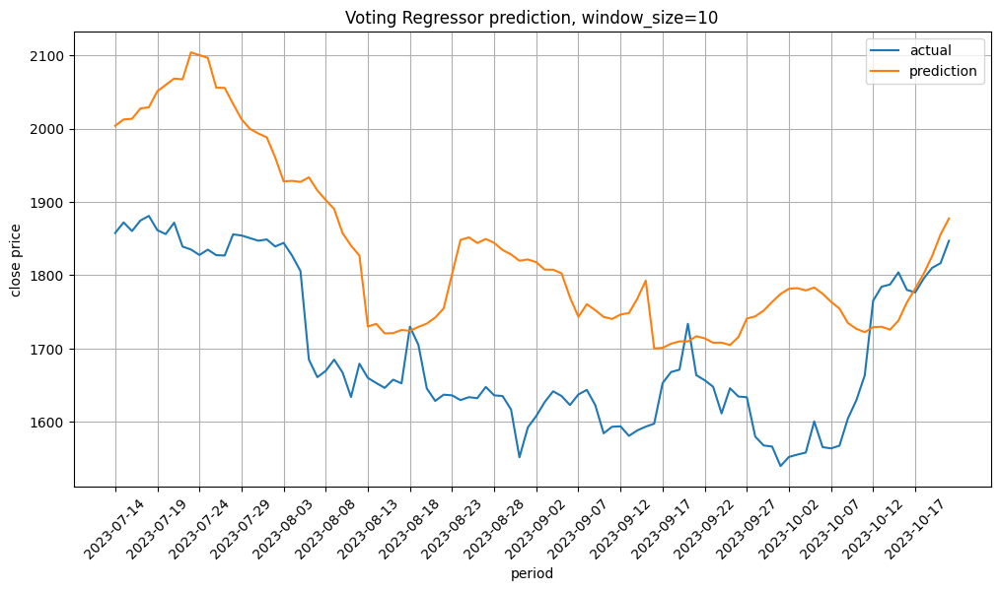

In [172]:
plt.figure(figsize=(12, 6))
plt.title('Voting Regressor prediction, window_size=10')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(date_values_bi,y_test_originalv, label='actual')
plt.plot(date_values_bi,y_pred_inv, label='prediction')
plt.grid()
plt.legend(loc='best')
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.show()

In [173]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# SHAP of Voting Regressor

In [174]:
features_vt = ['Principal_Component_' + str(i) for i in range(1, X_vtest_pca.shape[-1]+1)]
features_vt

['Principal_Component_1',
 'Principal_Component_2',
 'Principal_Component_3',
 'Principal_Component_4',
 'Principal_Component_5',
 'Principal_Component_6',
 'Principal_Component_7',
 'Principal_Component_8',
 'Principal_Component_9',
 'Principal_Component_10',
 'Principal_Component_11']

In [175]:
explainer = shap.KernelExplainer(vr.predict, shap.sample(X_pca_v, 10))  # Using 100 background samples for better performance
x_vtest_2d = np.reshape(X_vtest_pca, (X_vtest_pca.shape[0], X_vtest_pca.shape[1]))
shap_values_vr = explainer.shap_values(x_vtest_2d)

  0%|          | 0/100 [00:00<?, ?it/s]

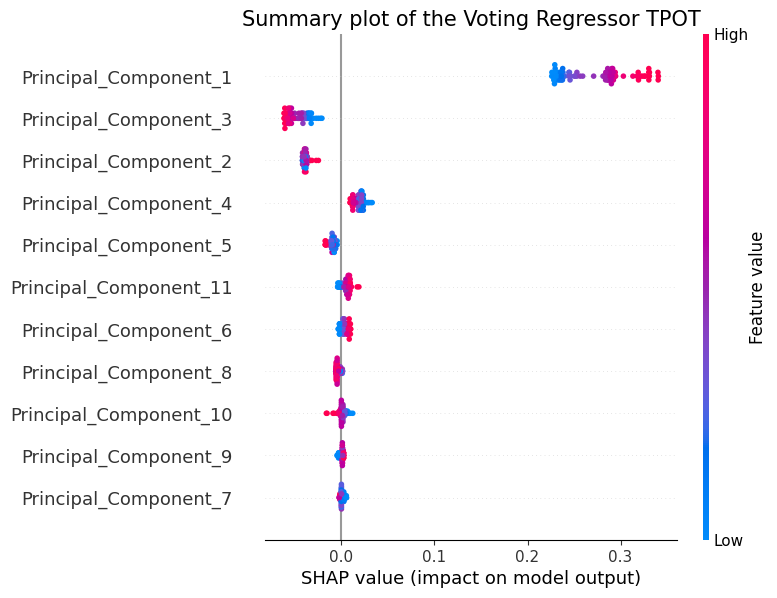

In [176]:
# Plot the SHAP values
#shap.summary_plot(shap_values_vr, x_vtest_2d,feature_names=actual_column_names)
shap.summary_plot(shap_values_vr, x_vtest_2d,feature_names=features_vt,show = False)
plt.title("Summary plot of the Voting Regressor TPOT",fontsize=15)
plt.show()
#shap.summary_plot(shap_values_vr, x_vtest_2d,feature_names=features_vt,title='Summary plot of Voting Regressor')


In [177]:
x_vtest_2d

array([[ 5.09989724e+00, -2.72384506e+00,  1.42974906e+00, ...,
        -4.01580953e-01, -3.28842374e-03,  2.42470227e-01],
       [ 5.10532696e+00, -2.74883219e+00,  1.43273167e+00, ...,
        -3.80782984e-01, -2.46012631e-02,  1.95853352e-01],
       [ 5.11752914e+00, -2.78290785e+00,  1.42995271e+00, ...,
        -3.55491384e-01, -5.48420444e-02,  1.61844110e-01],
       ...,
       [ 3.83624914e+00, -2.60536432e+00,  5.99207672e-01, ...,
        -1.92322253e-01, -3.09950236e-02,  1.72960183e-01],
       [ 3.80659052e+00, -2.54249131e+00,  5.41438600e-01, ...,
        -1.77377786e-01, -2.57807371e-02,  1.63779777e-01],
       [ 3.80182891e+00, -2.48443916e+00,  5.06268659e-01, ...,
        -1.63797611e-01, -8.64245886e-03,  1.56135241e-01]])

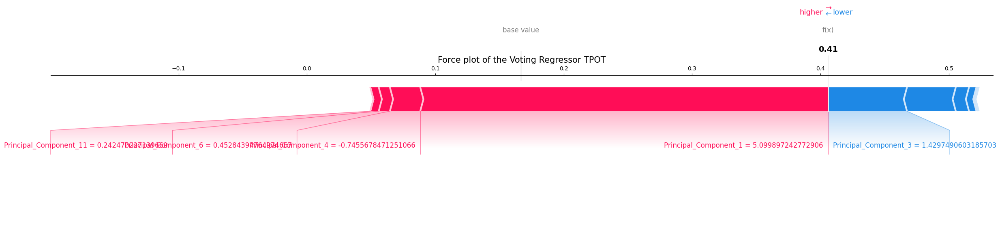

In [178]:
#Force_plot of the Voting Regressor
expected_value_vr = explainer.expected_value

instance_index = 0

shap.force_plot(expected_value_vr, shap_values_vr[instance_index], x_vtest_2d[instance_index],
                feature_names=features_vt,matplotlib=True,show = False,figsize=(30,5))

plt.title("Force plot of the Voting Regressor TPOT",fontsize=15)
plt.show()

In [179]:
X.shape

(2153, 510)

In [180]:
x_vtest_2d_df = pd.DataFrame(x_vtest_2d, columns = features_vt)

In [181]:
x_vtest_2d_df

,Principal_Component_1,Principal_Component_2,Principal_Component_3,Principal_Component_4,Principal_Component_5,Principal_Component_6,Principal_Component_7,Principal_Component_8,Principal_Component_9,Principal_Component_10,Principal_Component_11
0,5.099897,-2.723845,1.429749,-0.745568,0.501932,0.452844,0.046298,-0.485145,-0.401581,-0.003288,0.242470
1,5.105327,-2.748832,1.432732,-0.731691,0.485200,0.448502,0.053683,-0.487701,-0.380783,-0.024601,0.195853
2,5.117529,-2.782908,1.429953,-0.710475,0.467392,0.451183,0.056780,-0.491135,-0.355491,-0.054842,0.161844
3,5.131833,-2.809404,1.431795,-0.687793,0.457809,0.452056,0.057032,-0.491717,-0.333275,-0.079093,0.127982
4,5.149719,-2.837736,1.432385,-0.662222,0.467035,0.446448,0.042980,-0.483353,-0.320888,-0.078256,0.131211
...,...,...,...,...,...,...,...,...,...,...,...
95,3.942738,-2.745678,0.735246,-0.808130,0.664399,-0.065076,-0.345376,-0.475464,-0.232905,-0.004923,0.176121
96,3.884085,-2.676977,0.663768,-0.868586,0.693508,-0.057827,-0.385169,-0.462227,-0.216076,-0.019108,0.175192
97,3.836249,-2.605364,0.599208,-0.929760,0.715778,-0.044191,-0.413472,-0.450570,-0.192322,-0.030995,0.172960
98,3.806591,-2.542491,0.541439,-0.998815,0.731242,-0.037151,-0.429809,-0.447574,-0.177378,-0.025781,0.163780


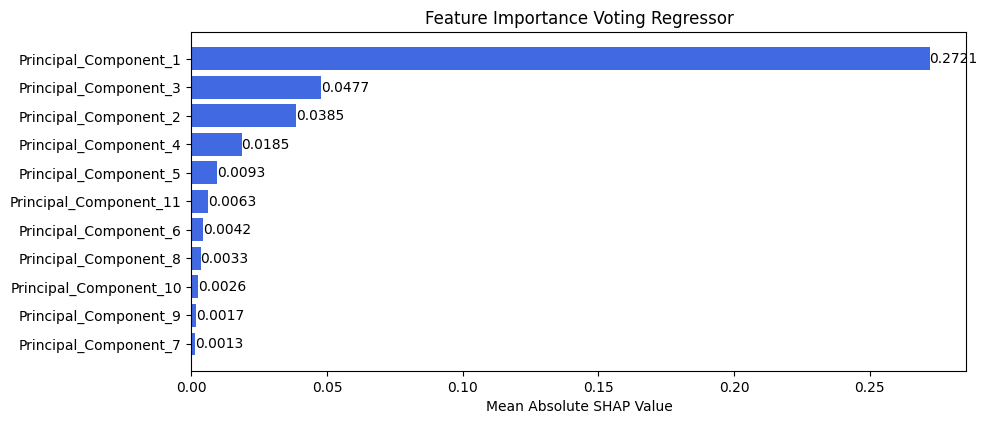

In [182]:
# Compute the mean absolute SHAP values for each feature
mean_shap_values_vr = np.abs(shap_values_vr).mean(axis=0)

# Sort the features based on their mean absolute SHAP values
sorted_indices_vr = np.argsort(mean_shap_values_vr)[::-1]

# If x_vtest_2d is a DataFrame, you can get the column names directly.
# Otherwise, replace `x_vtest_2d.columns` with appropriate column names.
sorted_features_vr = x_vtest_2d_df.columns[sorted_indices_vr]
sorted_shap_values_vr = mean_shap_values_vr[sorted_indices_vr]

# Create the bar plot
plt.figure(figsize=(10, len(sorted_features_vr) * 0.4))
plt.barh(sorted_features_vr, sorted_shap_values_vr, color='royalblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance Voting Regressor')

# Annotate each bar with its exact value
for index, value in enumerate(sorted_shap_values_vr):
    plt.text(value, index, f'{value:.4f}', va='center')

plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()


# Summary of whole model

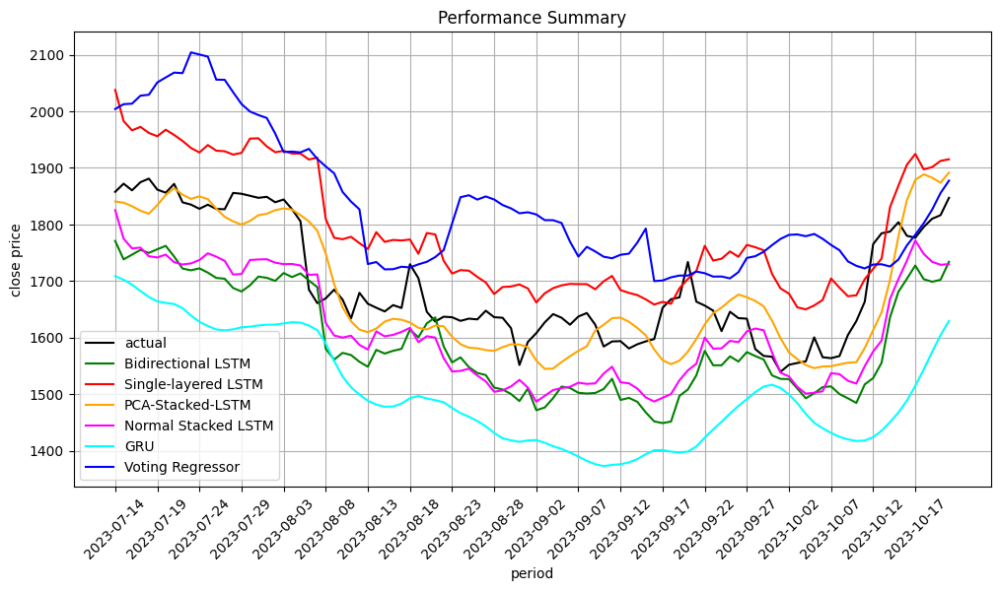

In [215]:
plt.figure(figsize=(12, 6))
plt.title('Performance Summary')
plt.ylabel('close price')
plt.xlabel('period')

plt.plot(date_values_bi,y_test_original, label='actual', color='black')
plt.plot(date_values_bi,y_pred_original, label='Bidirectional LSTM', color='green')
plt.plot(date_values_bi,y_single_pred_original, label='Single-layered LSTM', color='red')
plt.plot(date_values_bi,y_pca_pred_original, label='PCA-Stacked-LSTM', color='orange')
plt.plot(date_values_bi,y_nstacked_pred_original, label='Normal Stacked LSTM', color='magenta')
plt.plot(date_values_bi,y_pred_gru_original, label='GRU', color='cyan')
plt.plot(date_values_bi,y_pred_inv, label='Voting Regressor',color = 'blue')
plt.xticks(np.arange(0, len(date_values_bi), step=5), date_values_bi[::5], rotation=45)

plt.grid()
plt.legend(loc='best')

plt.show()


In [184]:
#Performance Evaluations
#1. Bidirectional-LSTM
real_rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_original))
real_mae = mean_absolute_error(y_test_original, y_pred_original)
real_mape = mean_absolute_percentage_error(y_test_original, y_pred_original)

print("RMSE of Bidirectional-LSTM:", real_rmse)
print("MAE of Bidirectional-LSTM:",real_mae)
print("MAPE of Bidirectional-LSTM:", real_mape)


#2. Single-Layered LSTM
real_rmse_single = np.sqrt(mean_squared_error(y_single_test_original, y_single_pred_original))
real_mae_single = mean_absolute_error(y_single_test_original, y_single_pred_original)
real_mape_single = mean_absolute_percentage_error(y_single_test_original, y_single_pred_original)

print("RMSE of Single-Layered-LSTM :", real_rmse_single)
print("MAE of Single-Layered-LSTM :", real_mae_single)
print("MAPE of Single-Layered-LSTM :", real_mape_single)



#3. PCA-Stacked-LSTM
real_rmse_stacked = np.sqrt(mean_squared_error(y_pca_test_original, y_pca_pred_original))
real_mae_stacked = mean_absolute_error(y_pca_test_original, y_pca_pred_original)
real_mape_stacked = mean_absolute_percentage_error(y_pca_test_original, y_pca_pred_original)

print("RMSE of PCA-Stacked-LSTM :", real_rmse_stacked)
print("MAE of PCA-Stacked-LSTM :", real_mae_stacked)
print("MAPE of PCA-Stacked-LSTM :", real_mape_stacked)



#4. Regular Stacked LSTM
real_rmse_rstacked = np.sqrt(mean_squared_error(y_nstacked_test_original, y_nstacked_pred_original))
real_mae_rstacked = mean_absolute_error(y_nstacked_test_original, y_nstacked_pred_original)
real_mape_rstacked = mean_absolute_percentage_error(y_nstacked_test_original, y_nstacked_pred_original)

print("RMSE of Regular-Stacked-LSTM :", real_rmse_rstacked)
print("MAE of Regular-Stacked-LSTM :", real_mae_rstacked)
print("MAPE of Regular-Stacked-LSTM :", real_mape_rstacked)


#5. GRU
# Calculate metrics with the real number value
real_rmse_gru = np.sqrt(mean_squared_error(y_test_gru_original, y_pred_gru_original))
real_mae_gru = mean_absolute_error(y_test_gru_original, y_pred_gru_original)
real_mape_gru = mean_absolute_percentage_error(y_test_gru_original, y_pred_gru_original)

print("RMSE of GRU:", real_rmse_gru)
print("MAE of GRU:",real_mae_gru)
print("MAPE of GRU:", real_mape_gru)

#6. Voting Regressor
rmse_vr = np.sqrt(mean_squared_error(y_test_originalv, y_pred_inv))
mae_vr = mean_absolute_error(y_test_originalv, y_pred_inv)
mape_vr = mean_absolute_percentage_error(y_test_originalv, y_pred_inv)

print("RMSE of Voting Regressor:", rmse_vr)
print("MAE of Voting Regressor:", mae_vr)
print("MAPE of Voting Regressor:", mape_vr)

RMSE of Bidirectional-LSTM: 114.29151575258184
MAE of Bidirectional-LSTM: 104.21760009765624
MAPE of Bidirectional-LSTM: 0.06097689676760656
RMSE of Single-Layered-LSTM : 103.5572442210539
MAE of Single-Layered-LSTM : 94.76470092773438
MAPE of Single-Layered-LSTM : 0.05624485006180655
RMSE of PCA-Stacked-LSTM : 58.91162169650828
MAE of PCA-Stacked-LSTM : 47.09552734375
MAPE of PCA-Stacked-LSTM : 0.02790890134280909
RMSE of Regular-Stacked-LSTM : 96.1852745592019
MAE of Regular-Stacked-LSTM : 86.56121215820312
MAPE of Regular-Stacked-LSTM : 0.05064207915745829
RMSE of GRU: 202.4619316653404
MAE of GRU: 192.09942626953125
MAPE of GRU: 0.11273268816563768
RMSE of Voting Regressor: 159.3585561695178
MAE of Voting Regressor: 142.02527698506736
MAPE of Voting Regressor: 0.0846169729933138


In [185]:
# Define the evaluation metrics and results
models = [
    "Bidirectional-LSTM",
    "Single-Layered-LSTM",
    "PCA-Stacked-LSTM",
    "Regular-Stacked-LSTM",
    "GRU",
    "Voting Regressor"
]



rmse_values = [
    real_rmse,
    real_rmse_single,
    real_rmse_stacked,
    real_rmse_rstacked,
    real_rmse_gru,
    rmse_vr
]



mae_values = [
    real_mae,
    real_mae_single,
    real_mae_stacked,
    real_mae_rstacked,
    real_mae_gru,
    mae_vr
]



mape_values = [
    real_mape,
    real_mape_single,
    real_mape_stacked,
    real_mape_rstacked,
    real_mape_gru,
    mape_vr
]



# Create a DataFrame
results_df = pd.DataFrame({
    "Model": models,
    "RMSE": rmse_values,
    "MAE": mae_values,
    "MAPE": mape_values
})



# Display the DataFrame
print(results_df)

                  Model        RMSE         MAE      MAPE
0    Bidirectional-LSTM  114.291516  104.217600  0.060977
1   Single-Layered-LSTM  103.557244   94.764701  0.056245
2      PCA-Stacked-LSTM   58.911622   47.095527  0.027909
3  Regular-Stacked-LSTM   96.185275   86.561212  0.050642
4                   GRU  202.461932  192.099426  0.112733
5      Voting Regressor  159.358556  142.025277  0.084617


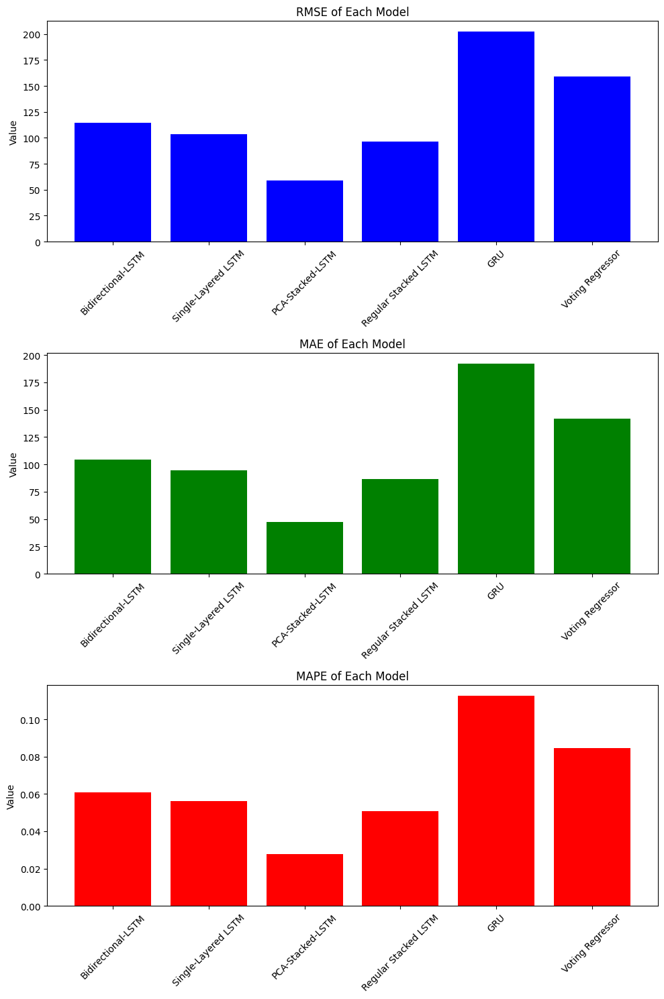

In [186]:
import matplotlib.pyplot as plt

# Model names
models = ['Bidirectional-LSTM', 'Single-Layered LSTM', 'PCA-Stacked-LSTM', 'Regular Stacked LSTM', 'GRU', 'Voting Regressor']

# RMSE values
rmse_values = [real_rmse, real_rmse_single, real_rmse_stacked, real_rmse_rstacked, real_rmse_gru, rmse_vr]

# MAE values
mae_values = [real_mae, real_mae_single, real_mae_stacked, real_mae_rstacked, real_mae_gru, mae_vr]

# MAPE values
mape_values = [real_mape, real_mape_single, real_mape_stacked, real_mape_rstacked, real_mape_gru, mape_vr]

# Create subplots
fig, axs = plt.subplots(3, figsize=(10, 15))

# Create RMSE bar chart
axs[0].bar(models, rmse_values, color='blue')
axs[0].set_title('RMSE of Each Model')
axs[0].set_ylabel('Value')

# Create MAE bar chart
axs[1].bar(models, mae_values, color='green')
axs[1].set_title('MAE of Each Model')
axs[1].set_ylabel('Value')

# Create MAPE bar chart
axs[2].bar(models, mape_values, color='red')
axs[2].set_title('MAPE of Each Model')
axs[2].set_ylabel('Value')

# Rotate x-axis labels for readability
for ax in axs:
    plt.sca(ax)
    plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Testing with unseen data

In [187]:
import pandas as pd

# Assuming 'data01.csv' contains your data
df_unseen = pd.read_csv("data01.csv")

# Define a dictionary with the new column names
new_column_names = {
    'date': 'Date',
    'eth-usd_Open': 'Open',
    'eth-usd_High': 'High',
    'eth-usd_Low': 'Low',
    'eth-usd_Close': 'Close',
    'eth-usd_Adj Close': 'Adj Close',
    'eth-usd_Volume': 'Volume'
}
# Rename the columns using the dictionary
df_unseen.rename(columns=new_column_names, inplace=True)

# Set 'date' as the index
df_unseen.set_index('Date', inplace=True)

# Now, your DataFrame has the updated column names and 'date' as the index
df_unseen.head()



,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,^n225_Open,^n225_High,^n225_Low,^n225_Close,^n225_Adj Close,^n225_Volume,day_sentiment,day_n_views,day_n_shares,FEDFUNDS
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,22989.439453,23382.150391,22522.830078,22868.710938,22868.710938,160400000.0,-0.216567,93713.0,933.0,1.16
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.102967,346006.0,3920.0,1.16
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,22580.699219,22724.390625,22511.929688,22681.419922,22681.419922,106600000.0,0.000000,0.0,0.0,1.16
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,22607.560547,22607.919922,22380.990234,22380.990234,22380.990234,80700000.0,-0.572450,74503.0,1089.0,1.16


In [188]:
#Making the percentage changes in each day
df_unseen['Pct_change'] = df_unseen['Close'].pct_change()
# data['Pct_change'] = np.log(1+data['Pct_change'])
df_unseen['Pct_change'] = np.log1p(df_unseen['Pct_change'])
# Choose the desired time periods for the moving averages
short_period = 12  # Short-term EMA period
long_period = 26  # Long-term EMA period
signal_period = 9  # Signal line EMA period

# Calculate the short-term EMA
df_unseen['Short EMA'] = df_unseen['Close'].ewm(span=short_period, adjust=False).mean()

# Calculate the long-term EMA
df_unseen['Long EMA'] = df_unseen['Close'].ewm(span=long_period, adjust=False).mean()

# Calculate the MACD line
df_unseen['MACD'] = df_unseen['Short EMA'] - df_unseen['Long EMA']

# Calculate the signal line
df_unseen['Signal Line'] = df_unseen['MACD'].ewm(span=signal_period, adjust=False).mean()

# Calculate the MACD histogram
df_unseen['MACD Histogram'] = df_unseen['MACD'] - df_unseen['Signal Line']
# Choose the desired time period for the moving average and standard deviation
window = 20  # Number of Trading days in a month
num_std = 2
# 2 standard deviations above and below the middle band provides
#a range that encompasses a large portion of typical price movements

# Calculate the logarithmic returns
df_unseen['Log Returns'] = np.log(df_unseen['Close'] / df_unseen['Close'].shift(1))

# Calculate the volatility
df_unseen['Volatility'] = df_unseen['Log Returns'].rolling(window=20).std() * np.sqrt(252)

# Calculate the middle band (simple moving average)
df_unseen['Middle Band'] = df_unseen['Close'].rolling(window=window).mean()

# Calculate the standard deviation of the closing prices
df_unseen['Std Dev'] = df_unseen['Close'].rolling(window=window).std()

# Calculate the upper band and lower band
df_unseen['Upper Band'] = df_unseen['Middle Band'] + (num_std * df_unseen['Std Dev'])
df_unseen['Lower Band'] = df_unseen['Middle Band'] - (num_std * df_unseen['Std Dev'])

#Making Next day's close price column in each date.
df_unseen['Next_day'] = df_unseen['Close'].shift(-1)


# Display the updated DataFrame with the Bollinger Bands columns
df_unseen

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-09,308.644989,329.451996,307.056000,320.884003,320.884003,8.932500e+08,7446.830078,7446.830078,7101.520020,7143.580078,...,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,299.252991
2017-11-10,320.670990,324.717987,294.541992,299.252991,299.252991,8.859860e+08,7173.729980,7312.000000,6436.870117,6618.140137,...,-1.725551,-0.345110,-1.380441,-0.069790,NaN,NaN,NaN,NaN,NaN,314.681000
2017-11-11,298.585999,319.453003,298.191986,314.681000,314.681000,8.423010e+08,6618.609863,6873.149902,6204.220215,6357.600098,...,-1.827089,-0.641506,-1.185583,0.050270,NaN,NaN,NaN,NaN,NaN,307.907990
2017-11-12,314.690002,319.153015,298.513000,307.907990,307.907990,1.613480e+09,6295.450195,6625.049805,5519.009766,5950.069824,...,-2.426118,-0.998428,-1.427690,-0.021758,NaN,NaN,NaN,NaN,NaN,316.716003
2017-11-13,307.024994,328.415009,307.024994,316.716003,316.716003,1.041890e+09,5938.250000,6811.189941,5844.290039,6559.490234,...,-2.165161,-1.231775,-0.933386,0.028204,NaN,NaN,NaN,NaN,NaN,337.631012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,34089.574219,...,45.485737,22.846100,22.639636,-0.001927,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,34538.480469,...,48.428640,27.962608,20.466032,0.010598,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623
2023-10-30,1795.589111,1829.249512,1779.364502,1810.088623,1810.088623,7.534051e+09,34531.742188,34843.933594,34110.972656,34502.363281,...,51.342534,32.638593,18.703940,0.008067,0.279047,1663.471027,108.299164,1880.069355,1446.872698,1816.458984


In [189]:
df_unseen.isnull().sum()

Open                  0
High                  0
Low                   0
Close                 0
Adj Close             0
Volume                0
btc-usd_Open          0
btc-usd_High          0
btc-usd_Low           0
btc-usd_Close         0
btc-usd_Adj Close     0
btc-usd_Volume        0
cl=f_Open             0
cl=f_High             0
cl=f_Low              0
cl=f_Close            0
cl=f_Adj Close        0
cl=f_Volume           0
^dji_Open             0
^dji_High             0
^dji_Low              0
^dji_Close            0
^dji_Adj Close        0
^dji_Volume           0
^gspc_Open            0
^gspc_High            0
^gspc_Low             0
^gspc_Close           0
^gspc_Adj Close       0
^gspc_Volume          0
^ixic_Open            0
^ixic_High            0
^ixic_Low             0
^ixic_Close           0
^ixic_Adj Close       0
^ixic_Volume          0
^n225_Open            0
^n225_High            0
^n225_Low             0
^n225_Close           0
^n225_Adj Close       0
^n225_Volume    

In [190]:
df_unseen = df_unseen.dropna()
df_unseen

,Open,High,Low,Close,Adj Close,Volume,btc-usd_Open,btc-usd_High,btc-usd_Low,btc-usd_Close,...,MACD,Signal Line,MACD Histogram,Log Returns,Volatility,Middle Band,Std Dev,Upper Band,Lower Band,Next_day
Date,,,,,,,,,,,,,,,,,,,,,
2017-11-29,473.281006,522.307007,425.071014,427.523010,427.523010,2.675940e+09,10077.400391,11517.400391,9601.030273,9888.610352,...,37.185784,28.226306,8.959477,-0.100880,0.846353,379.305402,63.888660,507.082721,251.528082,447.114014
2017-11-30,431.214996,465.497009,401.243011,447.114014,447.114014,1.903040e+09,9906.790039,10801.000000,9202.049805,10233.599609,...,36.310079,29.843061,6.467018,0.044806,0.791214,386.698453,62.681287,512.061027,261.335879,466.540009
2017-12-01,445.209015,472.609009,428.312012,466.540009,466.540009,1.247880e+09,10198.599609,11046.700195,9694.650391,10975.599609,...,36.759847,31.226418,5.533429,0.042530,0.787766,394.291403,62.696023,519.683448,268.899358,463.449005
2017-12-02,466.851013,476.239014,456.653015,463.449005,463.449005,9.436500e+08,10978.299805,11320.200195,10905.099609,11074.599609,...,36.446739,32.270482,4.176256,-0.006647,0.778998,402.068454,61.041859,524.152173,279.984735,465.852997
2017-12-03,463.704987,482.813995,451.851990,465.852997,465.852997,9.905570e+08,11082.700195,11858.700195,10862.000000,11323.200195,...,35.977849,33.011956,2.965894,0.005174,0.780244,409.525304,59.146294,527.817892,291.232715,470.204010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-27,1803.794922,1804.135864,1751.440063,1780.045288,1780.045288,7.493400e+09,34156.500000,34238.210938,33416.886719,33909.800781,...,42.995111,17.186191,25.808920,-0.013389,0.316190,1633.411798,94.617292,1822.646382,1444.177214,1776.618164
2023-10-28,1780.084229,1800.605347,1773.436646,1776.618164,1776.618164,4.226113e+09,33907.722656,34399.390625,33874.804688,34089.574219,...,45.485737,22.846100,22.639636,-0.001927,0.316497,1640.565277,99.889625,1840.344527,1440.786027,1795.546021
2023-10-29,1776.563965,1810.488647,1766.052979,1795.546021,1795.546021,4.358528e+09,34089.371094,34743.261719,33947.566406,34538.480469,...,48.428640,27.962608,20.466032,0.010598,0.283947,1651.352246,104.524248,1860.400743,1442.303749,1810.088623


In [191]:
df_unseen.isnull().sum()

Open                 0
High                 0
Low                  0
Close                0
Adj Close            0
Volume               0
btc-usd_Open         0
btc-usd_High         0
btc-usd_Low          0
btc-usd_Close        0
btc-usd_Adj Close    0
btc-usd_Volume       0
cl=f_Open            0
cl=f_High            0
cl=f_Low             0
cl=f_Close           0
cl=f_Adj Close       0
cl=f_Volume          0
^dji_Open            0
^dji_High            0
^dji_Low             0
^dji_Close           0
^dji_Adj Close       0
^dji_Volume          0
^gspc_Open           0
^gspc_High           0
^gspc_Low            0
^gspc_Close          0
^gspc_Adj Close      0
^gspc_Volume         0
^ixic_Open           0
^ixic_High           0
^ixic_Low            0
^ixic_Close          0
^ixic_Adj Close      0
^ixic_Volume         0
^n225_Open           0
^n225_High           0
^n225_Low            0
^n225_Close          0
^n225_Adj Close      0
^n225_Volume         0
day_sentiment        0
day_n_views

In [192]:
df_unseen[["Close","Short EMA", "Long EMA","Middle Band", 'Upper Band', 'Lower Band']].plot(figsize=(10,7))
plt.legend(loc="best")
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Close Price trend with BollingerBand and the EMA")

Text(0.5, 1.0, 'Close Price trend with BollingerBand and the EMA')



### Preprocessing

In [193]:
scaler = MinMaxScaler()

scale_cols = ['Open', 'High', 'Low', 'Pct_change', 'MACD','Signal Line','Volatility','Middle Band', 'Std Dev',
       'Upper Band', 'Lower Band', 'Next_day']

scaled_df_unseen = scaler.fit_transform(df_unseen[scale_cols])

scaled_df_unseen = pd.DataFrame(scaled_df_unseen, columns=scale_cols)

print(scaled_df_unseen)

          Open      High       Low  Pct_change      MACD  Signal Line  \
0     0.082315  0.090914  0.073835    0.572715  0.463765     0.465773   
1     0.073413  0.079094  0.068694    0.758190  0.462639     0.468150   
2     0.076374  0.080574  0.074534    0.755293  0.463217     0.470183   
3     0.080954  0.081329  0.080649    0.692684  0.462815     0.471717   
4     0.080288  0.082697  0.079613    0.707734  0.462212     0.472807   
...        ...       ...       ...         ...       ...          ...   
2158  0.363858  0.357608  0.359986    0.684101  0.471231     0.449548   
2159  0.358840  0.356873  0.364731    0.698694  0.474432     0.457866   
2160  0.358095  0.358930  0.363139    0.714639  0.478214     0.465386   
2161  0.362121  0.362833  0.366010    0.711417  0.481959     0.472258   
2162  0.365198  0.360903  0.367133    0.705620  0.484795     0.478405   

      Volatility  Middle Band   Std Dev  Upper Band  Lower Band  Next_day  
0       0.324340     0.063604  0.091845    0.08

In [194]:
pca = PCA()
X_pca_unseen = pca.fit_transform(scaled_df_unseen)
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

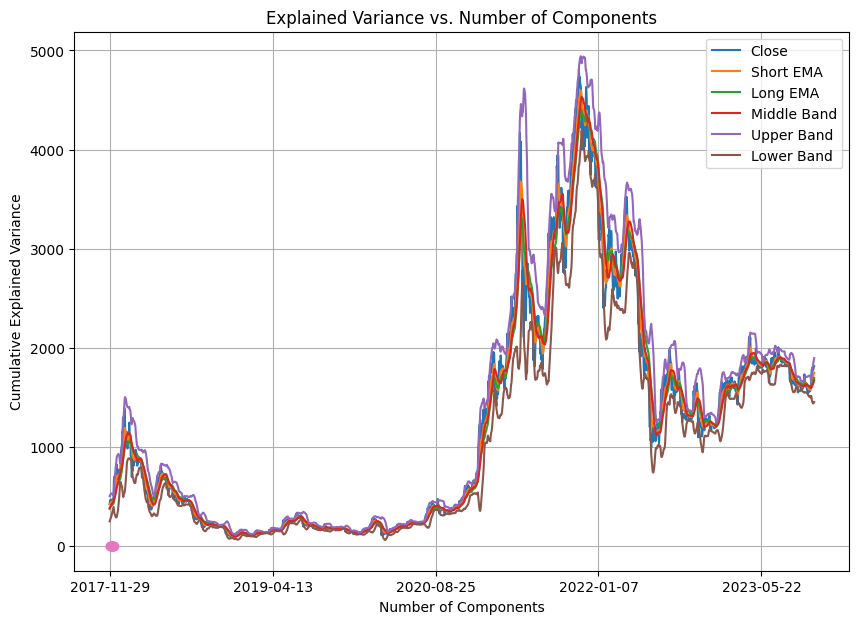

In [195]:
# Plot the cumulative explained variance against the number of components
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

In [196]:
n_components = 6
pca = PCA(n_components=n_components)
X_pca_unseen = pca.fit_transform(scaled_df_unseen)

In [197]:
# Access the principal components
principal_components = pca.components_

# Access the explained variance of each principal component
explained_variances = pca.explained_variance_ratio_

# Print the explained variance of each principal component
for i, explained_variance in enumerate(explained_variances):
    print(f"Principal Component {i+1}: {explained_variance:.4f}")



Principal Component 1: 0.8726
Principal Component 2: 0.0530
Principal Component 3: 0.0493
Principal Component 4: 0.0127
Principal Component 5: 0.0080
Principal Component 6: 0.0036


In [198]:
X_pca_df_unseen = pd.DataFrame(X_pca_unseen)
X_pca_df_unseen

,0,1,2,3,4,5
0,-0.452056,0.028289,0.101644,-0.000589,0.126033,-0.037476
1,-0.458229,0.007321,0.093238,0.024054,-0.052100,0.008751
2,-0.452701,0.004814,0.093788,0.023586,-0.049049,0.008081
3,-0.446670,0.000754,0.090800,0.017878,0.011758,-0.004920
4,-0.445053,-0.000511,0.090272,0.015584,-0.002735,0.000337
...,...,...,...,...,...,...
2158,0.286007,-0.167656,-0.046535,0.044565,0.016638,-0.035734
2159,0.290627,-0.168115,-0.037419,0.051765,0.002874,-0.029247
2160,0.296189,-0.179397,-0.035061,0.065830,-0.010721,-0.021001
2161,0.305067,-0.182383,-0.028472,0.070306,-0.006479,-0.019620


In [199]:
# Split x_pca into input sequences and target values
lookback = 10 #Using past 10 days'daily data of below columns'data to predict the 'Next_day' price
data_columns = [ 'Open', 'High', 'Low', 'Pct_change', 'MACD','Signal Line','Volatility' ,'Middle Band', 'Std Dev',
                'Upper Band', 'Lower Band']
target_columns = ['Next_day']

X_unseen = []
y_unseen = []
for i in range(len(X_pca_unseen) - lookback):
    X_unseen.append(X_pca_unseen[i:i+lookback])
    y_unseen.append(df_unseen['Next_day'].values[i+lookback])

# Convert to numpy arrays
X_unseen = np.array(X_unseen)
y_unseen = np.array(y_unseen)

In [200]:
# Scale the input sequences (X)
scaler = MinMaxScaler()
#X = scaler.fit_transform(X_pca.reshape(X.shape[0], -1))
X_unseen = scaler.fit_transform(X_unseen.reshape(X_unseen.shape[0], -1))

# Scale the target variable (y)
y_scaler = MinMaxScaler()
y_unseen = y_scaler.fit_transform(y_unseen.reshape(-1, 1))

In [201]:
X_unseen = X_unseen.reshape((X_unseen.shape[0], lookback, -1))

In [202]:
#Predict the KOSPI value
y_pred_unseen = stacked_lstm_model.predict(X_unseen)

In [203]:
# Calculate error metrics
real_rmse_unseen = np.sqrt(mean_squared_error(y_unseen, y_pred_unseen))
real_mse_unseen = mean_squared_error(y_unseen, y_pred_unseen)
real_mae_unseen = mean_absolute_error(y_unseen, y_pred_unseen)
real_mape_unseen = mean_absolute_percentage_error(y_unseen, y_pred_unseen)

# Print each value
print("RMSE (unseen data):", real_rmse_unseen)
print("MSE (unseen data):", real_mse_unseen)
print("MAE (unseen data):", real_mae_unseen)
print("MAPE (unseen data):", real_mape_unseen)

RMSE (unseen data): 0.10633347669549106
MSE (unseen data): 0.011306808266150542
MAE (unseen data): 0.09090422213055878
MAPE (unseen data): 200370423163.99002


In [204]:
y_pred_unseen

array([[-0.01608232],
       [-0.01811051],
       [-0.00939906],
       ...,
       [ 0.29071236],
       [ 0.28621382],
       [ 0.28413337]], dtype=float32)

In [205]:
y_unseen

array([[0.07559844],
       [0.09112687],
       [0.11995542],
       ...,
       [0.36502981],
       [0.36637725],
       [0.37285613]])

In [206]:
y_pred_unseen_original = y_scaler.inverse_transform(y_pred_unseen)
y_unseen_original = y_scaler.inverse_transform(y_unseen)

In [207]:
y_pred_unseen_original

array([[ 8.2746382e+00],
       [-1.3142121e+00],
       [ 3.9871609e+01],
       ...,
       [ 1.4587322e+03],
       [ 1.4374640e+03],
       [ 1.4276282e+03]], dtype=float32)

In [208]:
y_unseen_original

array([[ 441.7210083 ],
       [ 515.13598633],
       [ 651.43103027],
       ...,
       [1810.08862305],
       [1816.45898438],
       [1847.08972168]])

In [209]:
# Calculate error metrics
real_rmse_unseen = np.sqrt(mean_squared_error(y_unseen_original, y_pred_unseen_original))
real_mae_unseen = mean_absolute_error(y_unseen_original, y_pred_unseen_original)
real_mape_unseen = mean_absolute_percentage_error(y_unseen_original, y_pred_unseen_original)

# Print each value
print("RMSE of PCA-STACKED LSTM with KOSPI:", real_rmse_unseen)
print("MAE of PCA-STACKED LSTM with KOSPI:", real_mae_unseen)
print("MAPE of PCA-STACKED LSTM with KOSPI:", real_mape_unseen)

RMSE of PCA-STACKED LSTM with KOSPI: 502.72119104593554
MAE of PCA-STACKED LSTM with KOSPI: 429.77508161472707
MAPE of PCA-STACKED LSTM with KOSPI: 0.9303435989125078


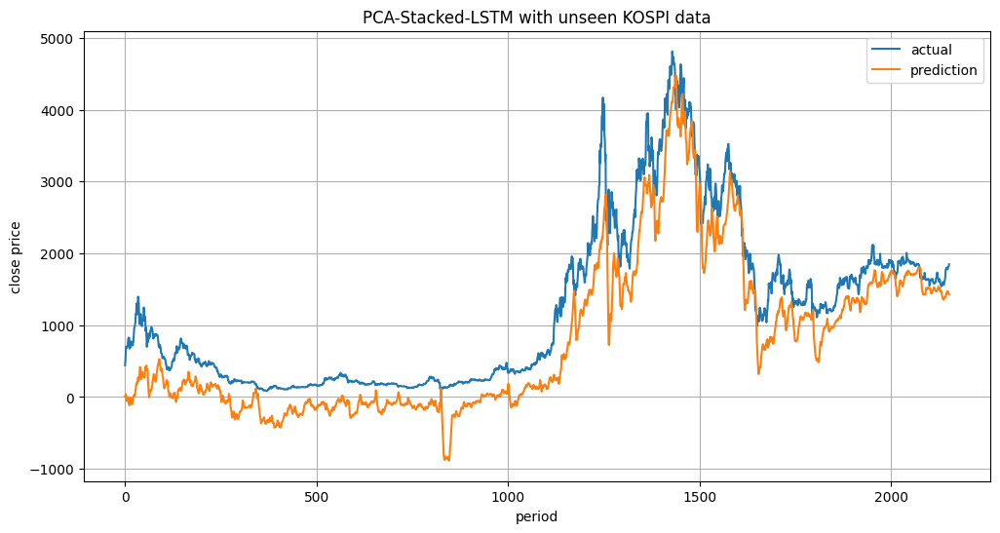

In [210]:
#Real values of prediction
plt.figure(figsize=(12, 6))
plt.title('PCA-Stacked-LSTM with unseen KOSPI data')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(y_unseen_original, label='actual')
plt.plot(y_pred_unseen_original, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()

In [211]:
dates_unseen = df_unseen.index[lookback:].values

In [212]:
df_unseen_reset = df_unseen.reset_index()
date_values_unseen = df_unseen_reset['Date'].iloc[train_index].values

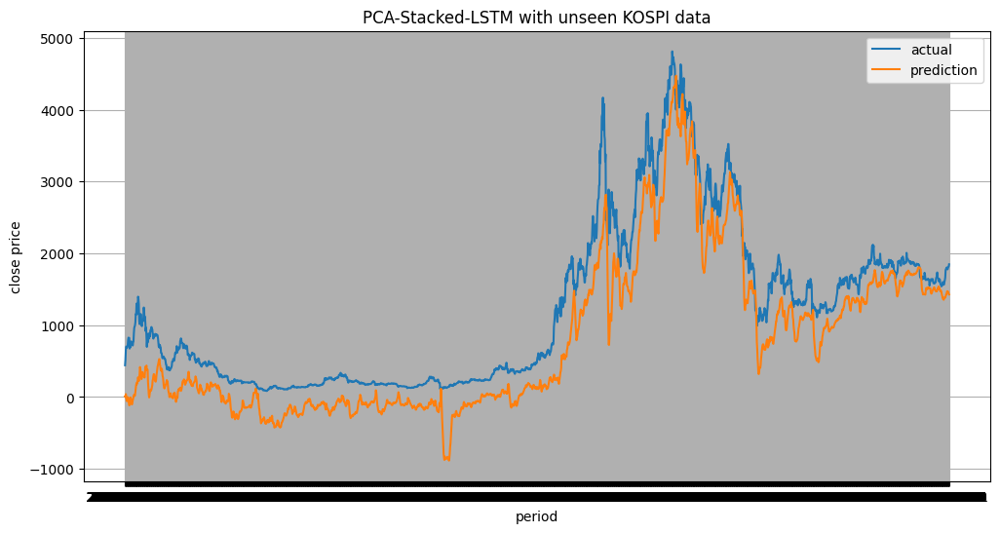

In [222]:
#Real values of prediction
plt.figure(figsize=(12, 6))
plt.title('PCA-Stacked-LSTM with unseen KOSPI data')
plt.ylabel('close price')
plt.xlabel('period')
plt.plot(dates_unseen,y_unseen_original, label='actual')
plt.plot(dates_unseen,y_pred_unseen_original, label='prediction')
plt.grid()
plt.legend(loc='best')

plt.show()